# <span style='color: gold'>P6 - Classifiez automatiquement des biens de consommation</span>

![logo_projet.png](logo_projet.png)

## <span style='background:PowderBlue' id="#section_2">1. Introduction</span>

Le but de ce projet est de réaliser une première étude de faisabilité d'un moteur de classification d'articles pour une marketplace e-commerce. L'étude sera basée sur l'image et la description d'article pour l'automatisation de l'attribution de la catégorie de l'article.

Voici les contraintes : 

Afin d’extraire les features **texte**, il sera nécessaire de mettre en œuvre :
- Deux approches de type “bag-of-words”, comptage simple de mots et Tf-idf 
- Une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) 
- Une approche de type word/sentence embedding avec BERT 
- Une approche de type word/sentence embedding avec USE (Universal Sentence Encoder)
  
Afin d’extraire les features **image**, il sera nécessaire de mettre en œuvre :
- Un algorithme de type SIFT / ORB / SURF ;
- Un algorithme de type CNN Transfer Learning.

In [5]:
# Chargement des librairies
import datetime
import time
import sys
import os
import string
import json
from datetime import datetime
from IPython.display import display, HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Réduction dimension
from sklearn.manifold import TSNE
# Traitement images
from PIL import Image as Image_PIL, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter

import numpy as np
import pandas as pd
import fonctions_data
import texthero as hero
import cprint
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import module_name
from module_name import *


#Algorithmes de classification supervisée
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB 
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import MiniBatchKMeans

# Feature extraction
import seaborn as sns
import sklearn
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, \
    HashingVectorizer

#Traitement de texte
import texthero as hero
from texthero import preprocessing
import nltk
import gensim
from nltk.corpus import stopwords
from nltk import word_tokenize, FreqDist
from stop_words import get_stop_words
from gensim.models import Word2Vec
import multiprocessing

# Réduction dimension
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn import decomposition
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

# BERT
import transformers
from sentence_transformers import SentenceTransformer

# USE
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import tensorflow_hub as hub
from sklearn.manifold import TSNE

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score
from sklearn.metrics import adjusted_rand_score, silhouette_score, homogeneity_score, recall_score, f1_score

# normalisation, encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Versions
print('Version des librairies utilisées :')
#print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('Sklearn               : ' + sklearn.__version__)
print('Outils dataframe      : ' + fonctions_data.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Matplotlib            : 3.7.5
Seaborn               : 0.13.2
Sklearn               : 1.3.0
Outils dataframe      : 0.0.0
Lancé le           : 2024-04-12T17:00:05.729710
Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Matplotlib            : 3.7.5
Seaborn               : 0.13.2
Sklearn               : 1.3.0
Outils dataframe      : 0.0.0
Lancé le           : 2024-04-12T17:00:06.061748


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\yanni\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## <span style='background:PowderBlue' id="#section_2">2. Dataset</span>

In [6]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

In [7]:
# Chargement du jeu de données

data = pd.read_csv('Data/Flipkart/flipkart_com-ecommerce_sample_1050.csv')

In [42]:
data_work = pd.read_csv('data_work.csv')

In [8]:
data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."


## <span style='background:PowderBlue'>3. IMAGES - Données Images</span>

### <span style='background:orange'>3.1. Analyse des données images</span>

Ajout d'une nouvelle variable **image_loc** contenant le chemin du répertoire de stockage des images ainsi que du nom du fichier image 

In [9]:
path = 'Data/Flipkart/Images/'
data['image_loc'] = [path + row for row in data['image']]

**Récupération de la 1ère strate de catégorie**

In [10]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data['product_category_tree'].str.split(' >> ', expand=True)
data['Categorie_1'] = work[0]
# Nettoye les [" et "]
data.replace('\\["', '', regex=True, inplace=True)
data.replace('"\\]', '', regex=True, inplace=True)

In [11]:
data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,image_loc,Categorie_1
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing >> Curtains & Accessories >> C...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Data/Flipkart/Images/55b85ea15a1536d46b7190ad6...,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,Baby Care >> Baby Bath & Skin >> Baby Bath Tow...,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Data/Flipkart/Images/7b72c92c2f6c40268628ec5f1...,Baby Care


**Dataframe spécifique pour traitement des images**

Pour la classifiaction des catégories, on gardera la variable **image**, **image_loc**, et **Categorie_1** 

In [12]:
data_imc = data.copy()
data_imc = data_imc[['product_name', 'image', 'image_loc', 'Categorie_1']]
data_imc.head(3)

,product_name,image,image_loc,Categorie_1
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Data/Flipkart/Images/55b85ea15a1536d46b7190ad6...,Home Furnishing
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Data/Flipkart/Images/7b72c92c2f6c40268628ec5f1...,Baby Care
2,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Data/Flipkart/Images/64d5d4a258243731dc7bbb1ee...,Baby Care


**Analyse exploratoire**

In [13]:
df_im_cat = data_imc.groupby('Categorie_1').agg({'image' : 'count'})
df_im_cat

,image
Categorie_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


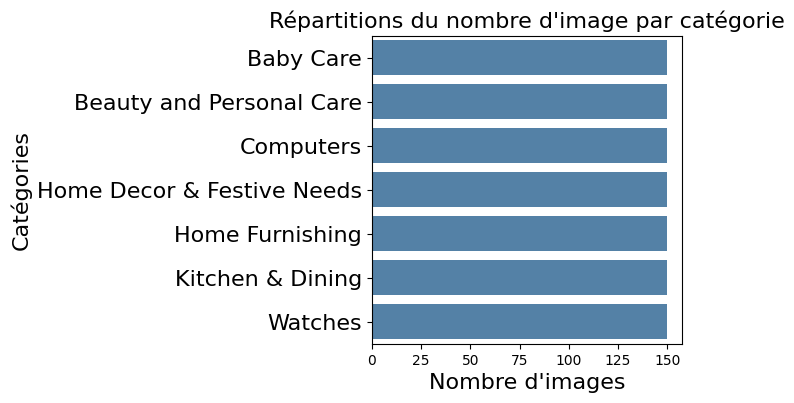

In [14]:
plt.figure(figsize=(4, 4))
sns.barplot(y=df_im_cat.index, x=df_im_cat.image,
            data=df_im_cat, color='SteelBlue')
plt.title('Répartitions du nombre d\'image par catégorie', fontsize=16)
plt.xlabel('Nombre d\'images', fontsize=16)
plt.ylabel('Catégories', fontsize=16)
plt.yticks(fontsize=16)
plt.grid(False)
plt.show()

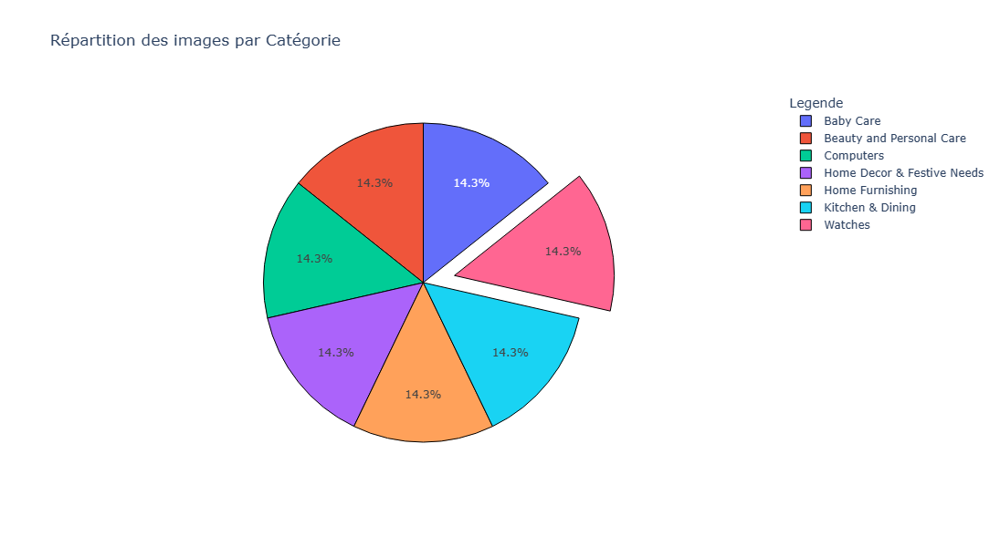

In [77]:
df_visu = df_im_cat.reset_index()
fonctions_data.trace_pieplot(df_visu, 'Categorie_1',
                          'Répartition des images par Catégorie',
                          'Legende', 6)

- Répartition équilibrée de 150 images

**Visualisation d'images**

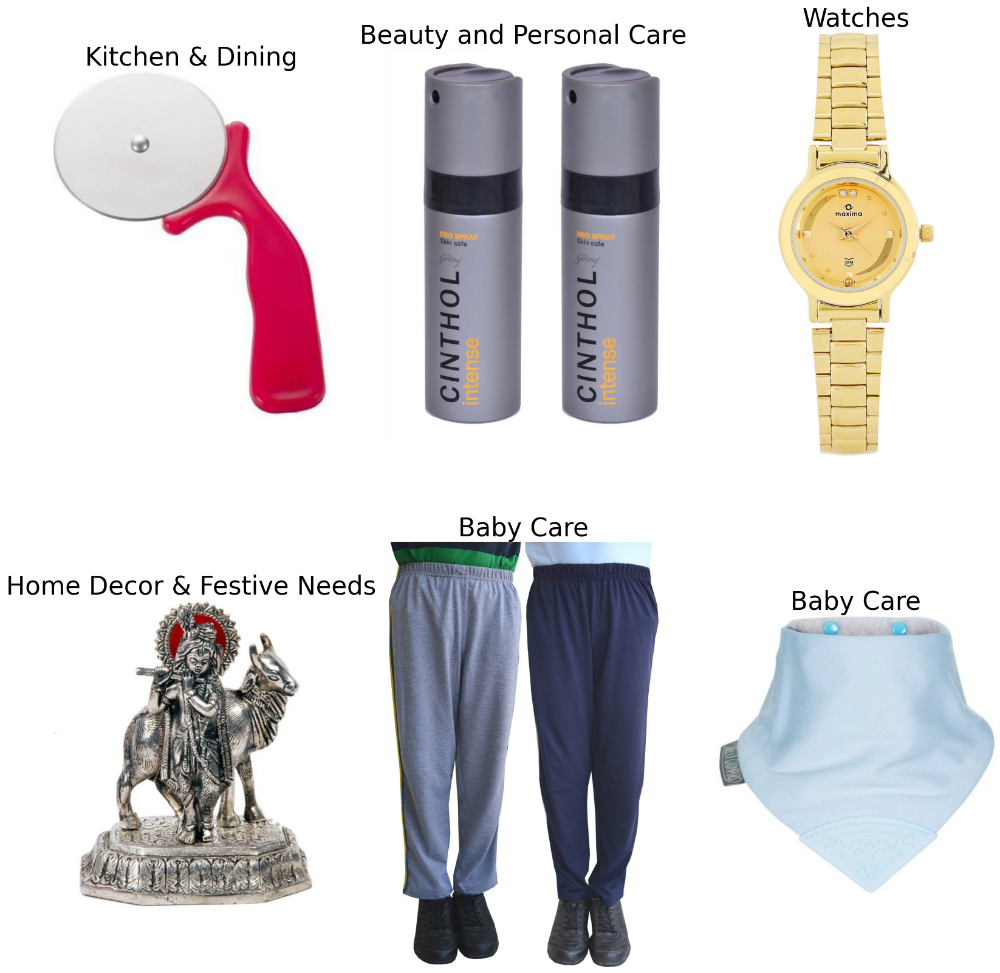

In [69]:
# Sélection de 6 images au hasard
df_visu_img = data.sample(6).reset_index()
plt.figure(figsize=(20, 20))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    # Charge l'image comme matrice de pixels
    img = np.array(Image.open(df_visu_img['image_loc'][i]))
    plt.imshow(img)
    plt.title(df_visu_img['Categorie_1'][i], fontsize=30)
    plt.axis('off')

**Distribution sur le dimensionnement des images**

In [75]:
# Largeur des images
data_imc['Largeur_img'] = [Image.open(row).size[0] for row in data['image_loc']]
# Hauteur des images
data_imc['Hauteur_img'] = [Image.open(row).size[1] for row in data['image_loc']]
# Taille des images
data_imc['Taille_img'] = [(Image.open(row).size[0])*(Image.open(row).size[1]) for row in data['image_loc']]

In [78]:
# Statistiques descriptives
fonctions_data.stat_descriptives(data_imc, ['Taille_img', 'Largeur_img',
                                     'Hauteur_img'])

,Variable name,Mean,Median,Skew,Kurtosis,Variance,Stdev,min,25%,50%,75%,max
0,Taille_img,1.916300e+06,1015850.0,13.457143,289.371778,1.534575e+13,3.917365e+06,58000,672375.00,1015850.0,1553940.00,93680328
1,Largeur_img,1.196570e+03,1100.0,2.845790,11.646568,7.459176e+05,8.636652e+02,145,747.25,1100.0,1214.25,8484
2,Hauteur_img,1.220038e+03,1100.0,3.661225,31.760927,5.542603e+05,7.444866e+02,160,844.00,1100.0,1360.00,11042


**Distribution de la largeur, hauteur, et taille des images**

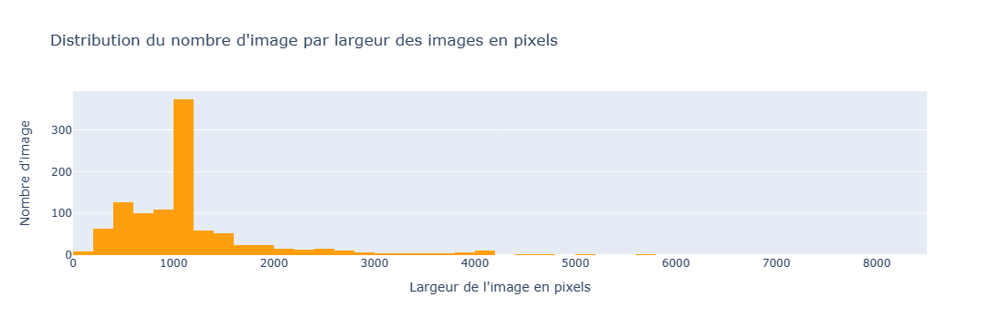

In [84]:
import plotly.express as px

# Répartition du nombre d'images par taille de l'image en pixel
fig = px.histogram(data_imc, x='Largeur_img', color_discrete_sequence=['#ff9f0e'], nbins=50, 
                   title='Distribution du nombre d\'image par largeur des images en pixels',
                   labels={'Largeur_img': 'Largeur de l\'image en pixels', 'count': 'Nombre d\'image'})
fig.update_layout(xaxis=dict(range=[0, 8500]), yaxis=dict(title='Nombre d\'image'), height=600)
fig.show()

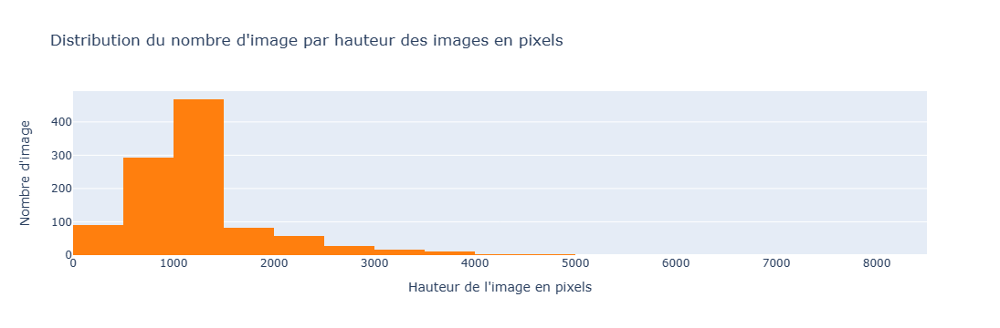

In [81]:
# Répartition du nombre d'images par taille de l'image en pixel
fig = px.histogram(data_imc, x='Hauteur_img', color_discrete_sequence=['#ff7f0e'], nbins=50, 
                   title='Distribution du nombre d\'image par hauteur des images en pixels',
                   labels={'Hauteur_img': 'Hauteur de l\'image en pixels', 'count': 'Nombre d\'image'})
fig.update_layout(xaxis=dict(range=[0, 8500]), yaxis=dict(title='Nombre d\'image'), height=600)
fig.show()

**Taille**

In [111]:
# Utilisation de la fonction pour obtenir les données
df_visu_taille = distribution_variables_plages(data_imc, 'Taille_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])

In [112]:
df_visu_taille

,Plage,nb_données,%_données
0,"(0, 500000]",165,15.714286
1,"(500000, 1000000]",353,33.619048
2,"(1000000, 5000000]",447,42.571429
3,"(5000000, 10000000]",52,4.952381
4,"(10000000, 100000000]",33,3.142857


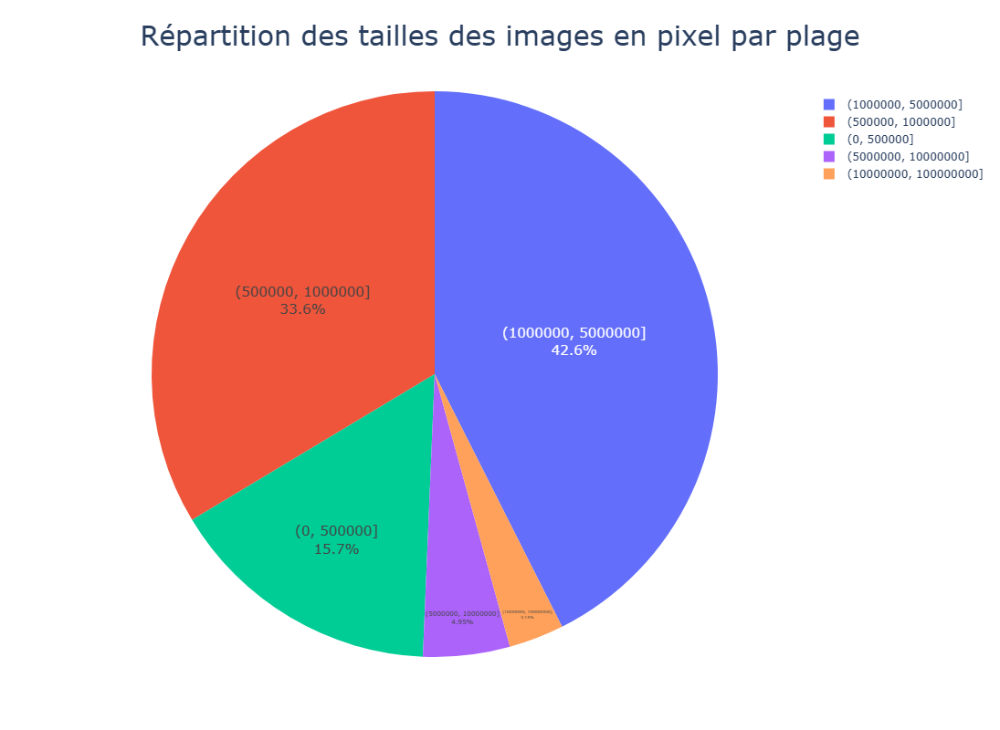

In [118]:
# Création du Pieplot avec Plotly
fig = px.pie(df_visu_taille, values='nb_données', names='Plage', title='Répartition des tailles des images en pixel par plage')

# Personnalisation de la mise en page
fig.update_layout(title_font_size=30, title_x=0.5)  # Ajustement de la taille et de la position du titre
fig.update_traces(textinfo='percent+label', textposition='inside', 
                  insidetextorientation='horizontal', textfont_size=15)  # Positionnement et formatage du texte

# Ajustement de la taille de la figure
fig.update_layout(height=800, width=1000)

fig.show()



### <span style='background:orange'>3.2. Pré-traitement images</span>

#### <span style='background:wheat'>3.2.1 Exemple image</span>

In [205]:
# Chargement de l'image originale comme matrice de pixels
img_orig = Image_PIL.open('Data/Flipkart/Images/fc93a41f31c4e997fbfcc5bd0a63ee65.jpg')

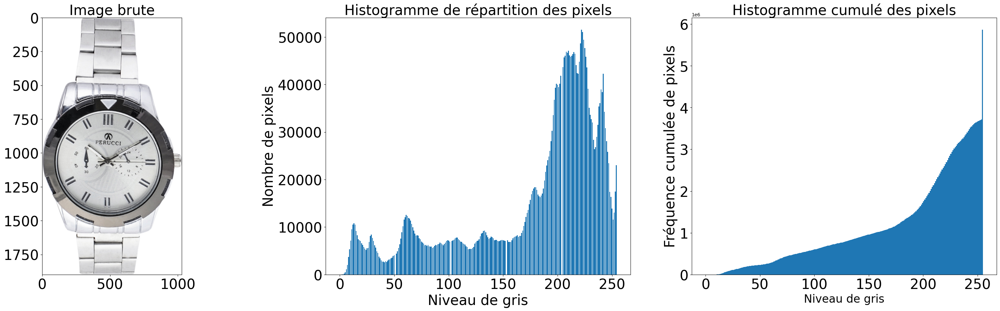

In [280]:
fonctions_data.display_image_histopixel(img_orig, 'Image brute')


**Correction de l'exposition (étirement d'histogramme)**

Image sur-exposée ==> histogramme concentré à droite vers les niveaux de gris faible (255 = blanc, image trop claire).   
Image sous-exposée ==> histogramme concentré à gauche vers les niveaux de gris fort (0 = noir, image trop sombre).

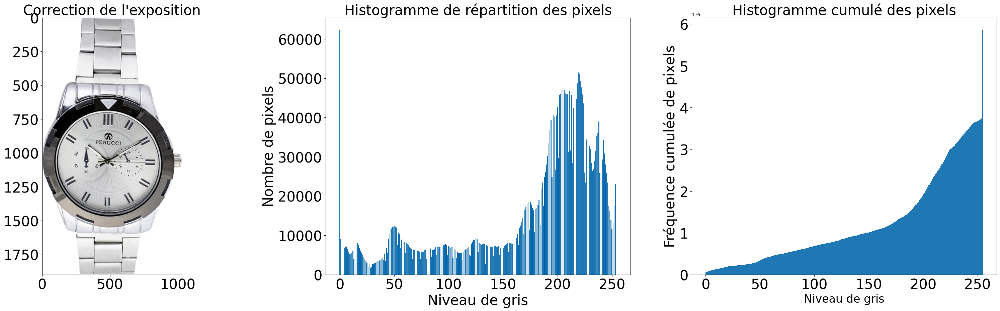

In [281]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
fonctions_data.display_image_histopixel(img_expo, 'Correction de l\'exposition')

**Correction du contraste (égalisation d'histogramme)**

Le contraste caractérise la répartition de lumière dans une image : plus une image est contrastée, plus la différence de luminosité entre ses zones claires et sombres est importante. 

**PILS**

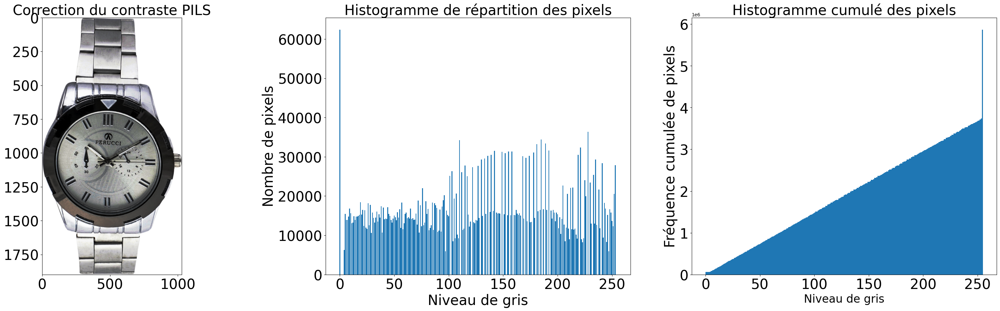

In [282]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
fonctions_data.display_image_histopixel(img_contr_pils, 'Correction du contraste PILS')

**OpenCV**

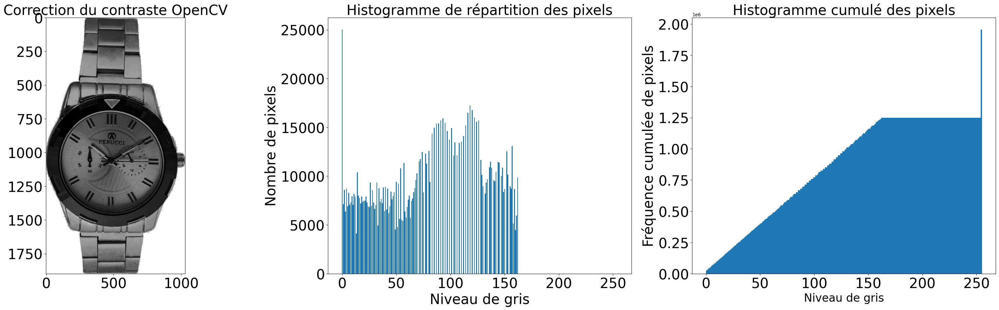

In [283]:
# Correction du contraste OpenCV méthode 1 : equalizeHist
img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
img_contr_opencv = cv2.equalizeHist(img_expo_gris)
fonctions_data.display_image_histopixel(img_contr_opencv, 'Correction du contraste OpenCV')

**CLAHE** (Contrast Limited Adaptive Histogram Equalization) : l'image est divisée en petits blocs appelés "tiles" (tileSize est 8x8 par défaut dans OpenCV). Chacun de ces blocs est égalisé en histogramme comme d'habitude. Ainsi, dans une petite zone, l'histogramme se limitera à une petite région (sauf s'il y a du bruit). Si le bruit est présent, il sera amplifié. Pour éviter cela, une limitation du contraste est appliquée. Si une case de l'histogramme est au-dessus de la limite de contraste spécifiée (par défaut 40 dans OpenCV), ces pixels sont coupés et distribués uniformément aux autres cases avant d'appliquer l'égalisation de l'histogramme. Après l'égalisation, l'interpolation bilinéaire est appliquée pour supprimer les artefacts sur les bords des 'tiles'. (Source opencv)

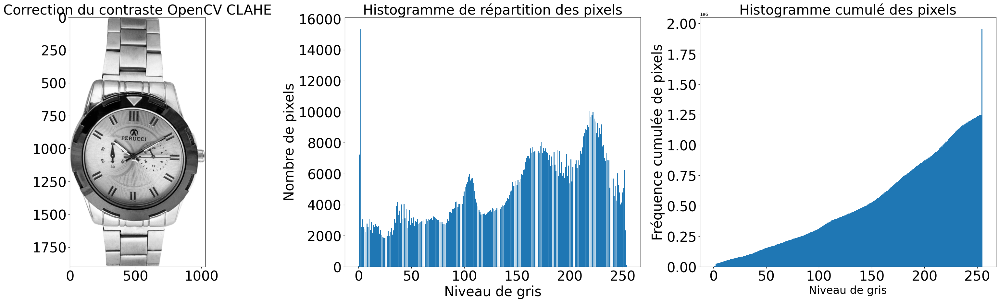

In [284]:
# Correction du contraste OpenCV méthode 2 : CLAHE
# img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img_contr_clahe = clahe.apply(img_expo_gris)
fonctions_data.display_image_histopixel(img_contr_clahe, 'Correction du contraste OpenCV CLAHE')

#### <span style='background:wheat'>3.2.2 Redimensionnement 224*224</span>

En entrées des réseaux de neurones, les images doivent avoir la taille 224 * 224

In [285]:
dim = (224, 224)

**PILS**

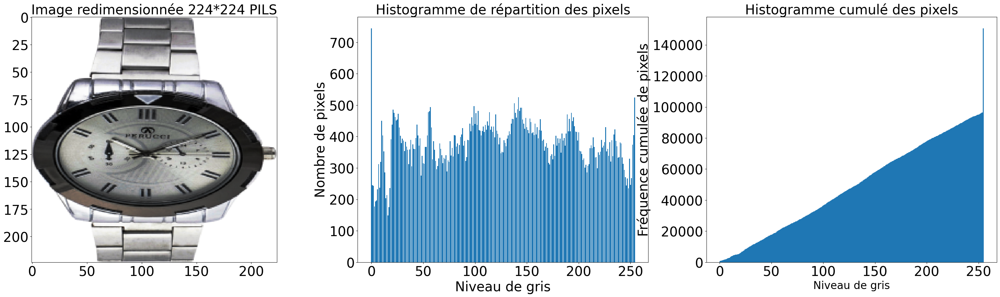

In [286]:
# Redimensionnement image contraste PILS
img_rdim_pils = cv2.resize(np.array(img_contr_pils), dim,
                            interpolation=cv2.INTER_AREA)
fonctions_data.display_image_histopixel(img_rdim_pils, 'Image redimensionnée 224*224 PILS')

**OpenCV**

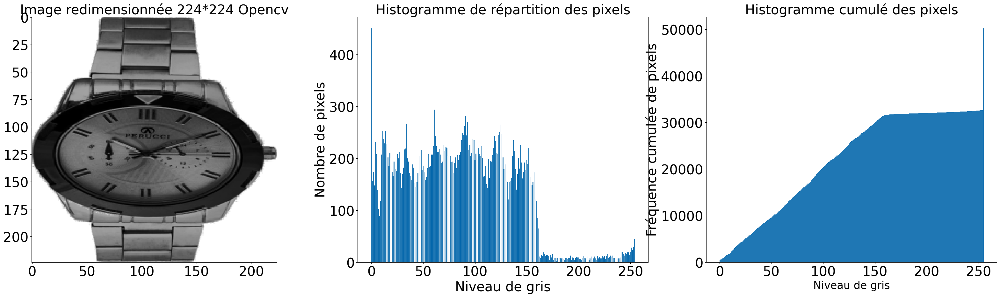

In [287]:
# Redimensionnement image contraste OpenCV
img_rdim_opencv = cv2.resize(np.array(img_contr_opencv), dim,
                              interpolation=cv2.INTER_AREA)
fonctions_data.display_image_histopixel(img_rdim_opencv, 'Image redimensionnée 224*224 Opencv')

**CLAHE**

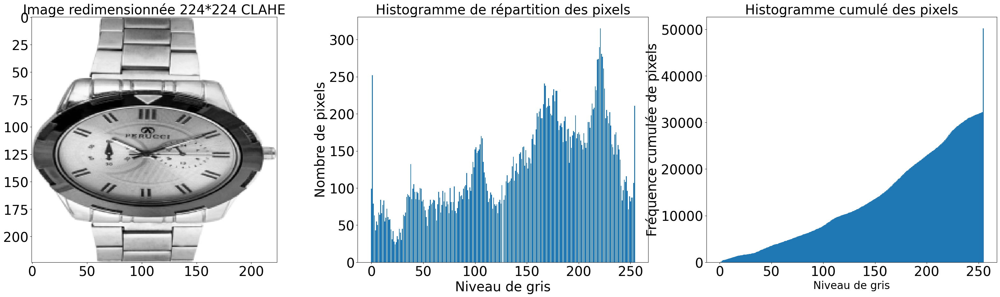

In [288]:
# Redimensionnement image contraste OpenCV CLAHE
img_rdim_clahe = cv2.resize(np.array(img_contr_clahe), dim,
                             interpolation=cv2.INTER_AREA)
fonctions_data.display_image_histopixel(img_rdim_clahe, 'Image redimensionnée 224*224 CLAHE')

#### <span style='background:wheat'>3.2.3 Conversion de l'image en niveau de gris</span>

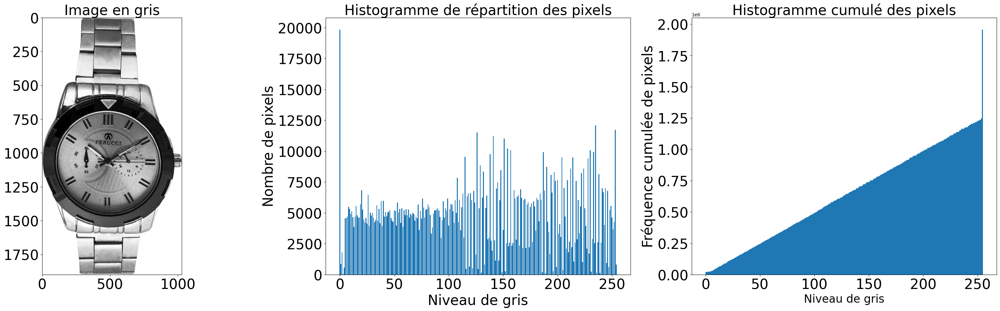

In [289]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv2.cvtColor(np.array(img_contr_pils), cv2.COLOR_RGB2GRAY)
fonctions_data.display_image_histopixel(img_gris,  'Image en gris')

#### <span style='background:wheat'>3.2.4 Réduction de bruit</span>

Pour améliorer la qualité des images, 3 filtres différents seront testés :
- 
un** filtre gaussie**  : nfiltre linéaire dont les éléments du noyau de convolution sont déterminés selon la densité d'une loi gaussienne centrée à 2 dimensions.
,- 
u**fn iltre par lissage par moyenna**ge la valeur de chaque pixel est remplacée par la moyenne de son voisinag.
)- ou **un filtre par lissage méd**ian (la valeur de chaque pixel est remplacée par la médiane de son voisinage).

**PILS**

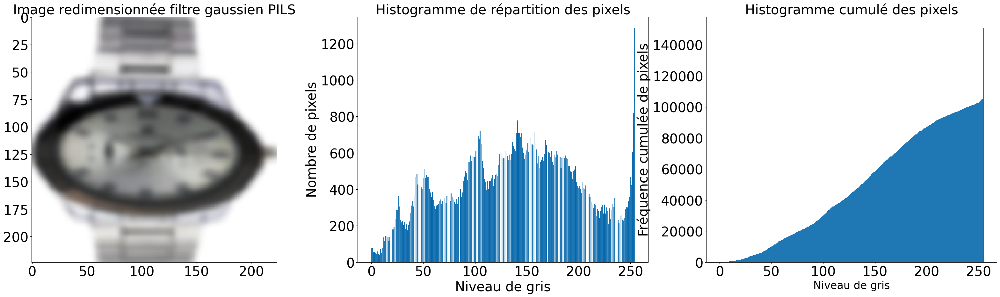

In [291]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_rdim_pils_rgb = Image.fromarray(img_rdim_pils, 'RGB')
img_gaus_pils = img_rdim_pils_rgb.filter(ImageFilter.GaussianBlur(radius=3))
fonctions_data.display_image_histopixel(img_gaus_pils, 'Image redimensionnée filtre gaussien PILS')

**OpenCV**

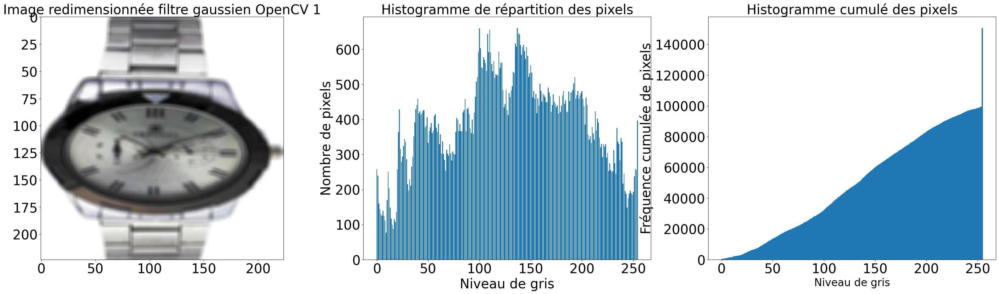

In [292]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_gaus_pils = cv2.GaussianBlur(img_rdim_pils, (5, 5), cv2.BORDER_DEFAULT)
fonctions_data.display_image_histopixel(img_gaus_pils, 'Image redimensionnée filtre gaussien OpenCV 1')

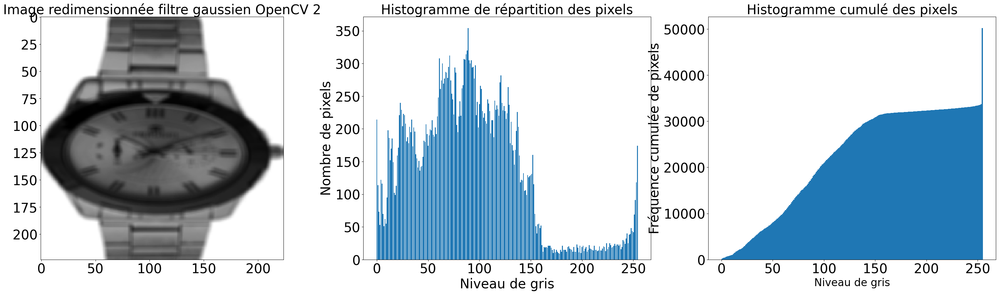

In [293]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_opencv = cv2.GaussianBlur(img_rdim_opencv, (5, 5),
                                   cv2.BORDER_DEFAULT)
fonctions_data.display_image_histopixel(img_gaus_opencv, 'Image redimensionnée filtre gaussien OpenCV 2')

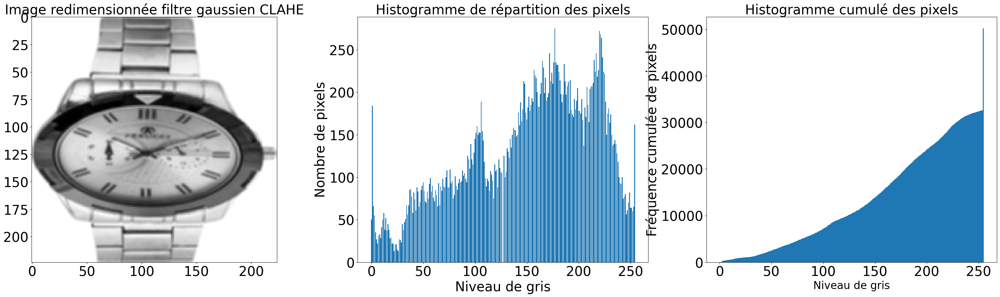

In [295]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_clahe = cv2.GaussianBlur(img_rdim_clahe, (3, 3), cv2.BORDER_DEFAULT)
fonctions_data.display_image_histopixel(img_gaus_clahe,  'Image redimensionnée filtre gaussien CLAHE')

**Scipy**

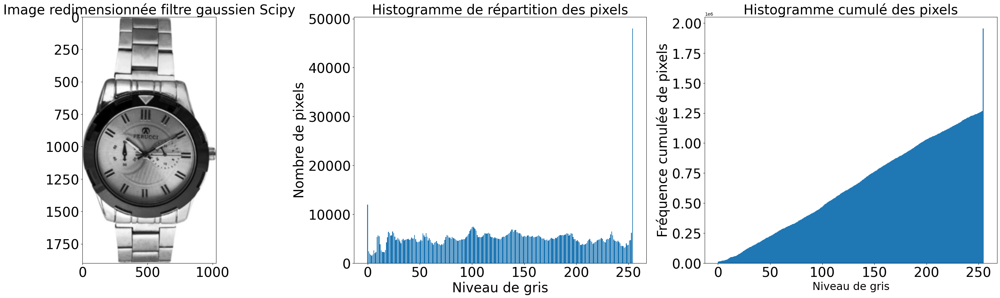

In [296]:
img_gaus_scipy = gaussian_filter(img_gris, sigma=3)
fonctions_data.display_image_histopixel(img_gaus_scipy, 'Image redimensionnée filtre gaussien Scipy')

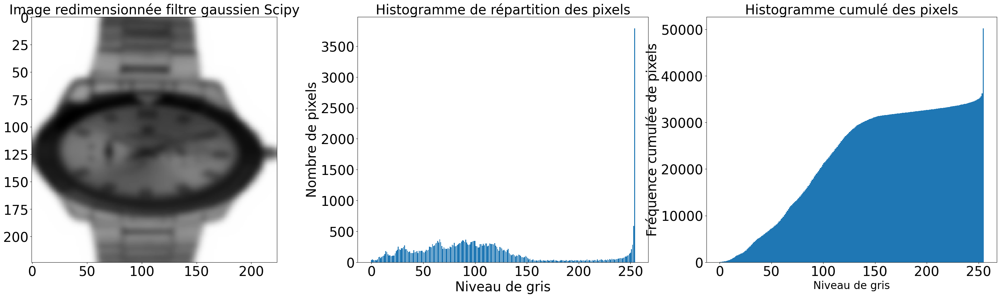

In [298]:
img_gaus_scipy2 = gaussian_filter(img_rdim_opencv, sigma=3)
fonctions_data.display_image_histopixel(img_gaus_scipy2, 'Image redimensionnée filtre gaussien Scipy')

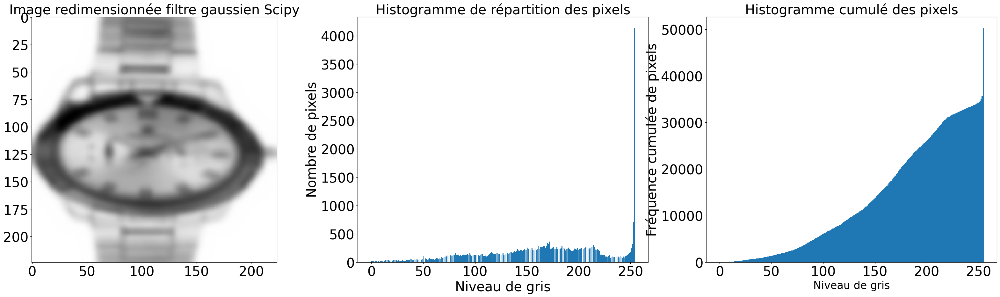

In [300]:
img_gaus_scipy2 = gaussian_filter(img_rdim_clahe, sigma=3)
fonctions_data.display_image_histopixel(img_gaus_scipy2, 'Image redimensionnée filtre gaussien Scipy')

**Réduction du bruit par un filtre médian**

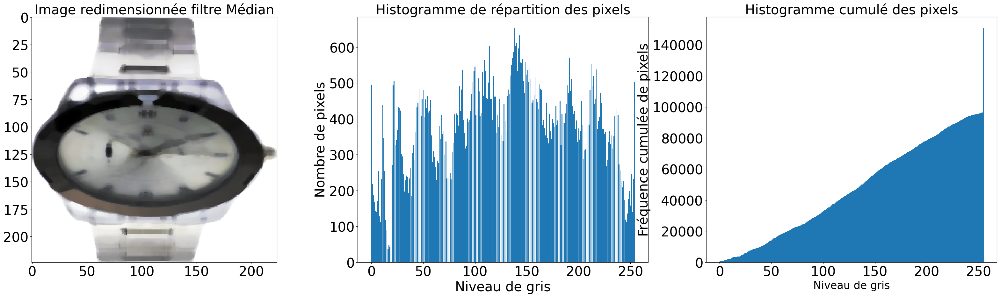

In [301]:
# Réduction du bruit filtre médian sur image correction contraste OpenCV
img_rdim_pils_rgb = Image.fromarray(img_rdim_pils, 'RGB')
img_median = img_rdim_pils_rgb.filter(ImageFilter.MedianFilter(size=7))
fonctions_data.display_image_histopixel(img_median, 'Image redimensionnée filtre Médian')

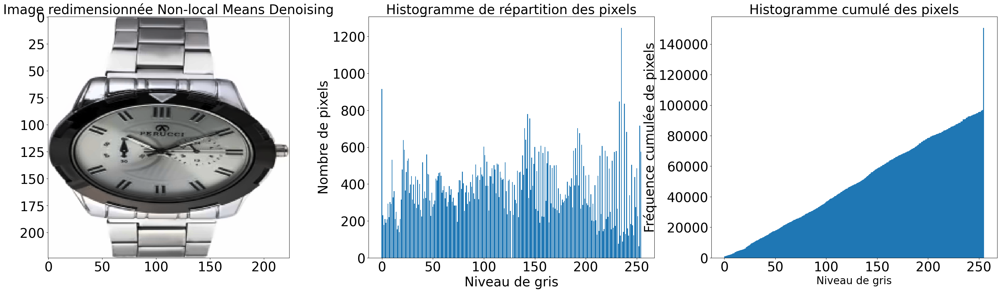

In [302]:
# Réduction du bruit avec l'algorithme  Non-local Means Denoising d'OpenCV
img_fast_pils = cv2.fastNlMeansDenoisingColored(img_rdim_pils, None, 5, 5, 7,
                                                21)
fonctions_data.display_image_histopixel(img_fast_pils, 'Image redimensionnée Non-local Means Denoising')

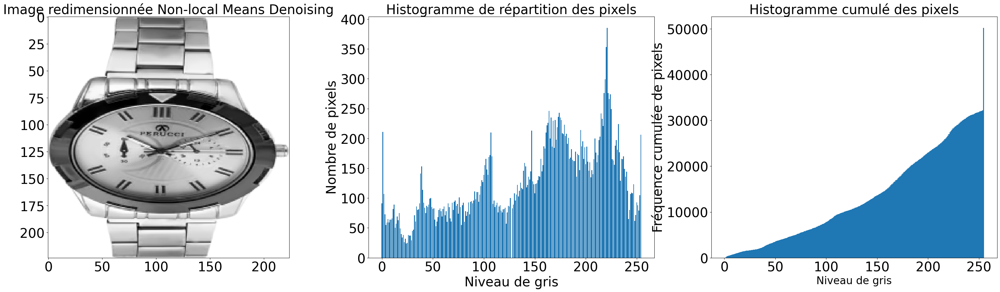

In [303]:
# Réduction du bruit filtre gaussien avec l'algorithme
# Non-local Means Denoising d'OpenCV
img_fast_clahe = cv2.fastNlMeansDenoising(img_rdim_clahe, None, 5, 7, 21)
fonctions_data.display_image_histopixel(img_fast_clahe, 'Image redimensionnée Non-local Means Denoising')

**Bilan** :

La réduction du bruit avec l'agorithme Non-local Means Denoising d'OpenCV donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

In [16]:
# dataframe avec les images traités
data_imc_t = data_imc.copy()

data_imc_t['image_proces'] = data_imc_t['image_loc'].apply(fonctions_data.preprocess_image)

In [17]:
# Pré-traitement de toutes les images PILS/OPENCV
data_imc_t['image_process2'] = \
    data_imc_t['image_loc'].apply(fonctions_data.process_image_opencv)

**Etapes de classification d'iamges:**

 La technique de **BOVW** sacs de mots visuels permet, pour chaque image, de noter les éléments les plus importants qui se détachent de l'image. Ces éléments sont les **features ou zones d'intérêt ou points clés**.
- A chaque feature est associé un vecteur qui décrit le voisinage de la feature à laquelle il est associé, ce sont les **descripteurs**.
- Un algorithme non supervisé permet de regrouper les éléments similaires des descripteurs dans des clusters. Chaque cluster contient des bouts d'images similaires présentent dans différentes images. Elles sont donc assimilables à des mots dans un texte d'où le nom de 'mot visuel'.
- Les images contiennent des proportions différentes de ces mots visuels, ce qui permet de trouver une similitude entre les images ayant des proportions de ces mots visuels proches.

### <span style='background:orange'>3.3. Features Extraction</span>

#### <span style='background:wheat'>3.3.1 Algorithme SIFT</span>

- SIFT (Scale Invariant Feature Transform),  cette méthode, développée en 1999 et très populaire dans le domaine de la vision par ordinateur, permet d'extraire des features (ou points d'intérêt) de l'image et de calculer leurs descripteurs. 
- L'algorithme SIFT se divise en plusieurs étapes :
    - Détection : création de l'espace des échelles, calcul des "DoG" (Différence of Gaussian), localisation des points d'intérêt.
    - Description : assignation d'orientation, création des descripteurs.

**Exemple avec l'image précédente**

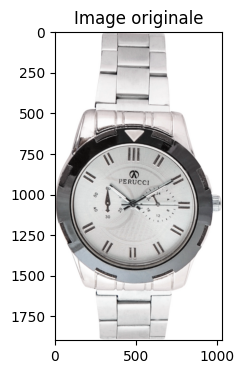

In [219]:
# Chargement de l'image précédemment traitée
montre = cv2.imread('Data/Flipkart/Images/fc93a41f31c4e997fbfcc5bd0a63ee65.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(montre)
plt.show()

##### <span style='background:gold'>3.3.1.1 Extraction des features (BOVW-Bag of Visual Words)</span>

In [220]:
# Transformation del'image en matrice de pixels pour OpenCV
montre = np.array(montre)
# Instanciation de SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Extraction des points d'intérêt et des descripteurs
sift_keypoints, sift_descripteurs = sift.detectAndCompute(montre, None)
nb_feat = sift_descripteurs.shape[0]
nb_desc = sift_descripteurs.shape[1]
print(f'SIFT Montre - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

SIFT Montre - Nombre de features=2054 pour 128 descripteurs


In [221]:
sift_descripteurs

array([[ 24.,   3.,   1., ...,   0.,   0.,   0.],
       [  1.,   2.,   2., ...,   0.,   0.,   7.],
       [ 73.,  56.,   1., ...,   0.,  34.,  70.],
       ...,
       [  0.,  44.,  49., ...,   0.,   0.,   4.],
       [  6.,  29.,  79., ...,   0.,   1.,   2.],
       [  0.,  36., 142., ...,  55.,  27.,  10.]], dtype=float32)

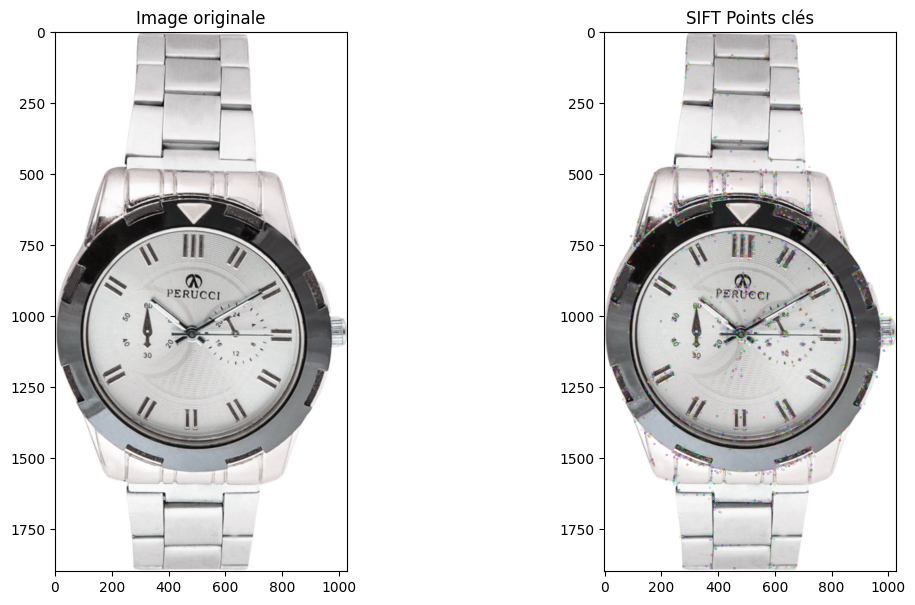

In [222]:
# Visualisation des points d'intérêt
sift_montre_keypoints = cv2.drawKeypoints(montre, sift_keypoints, None)

plt.figure(figsize=(13, 7))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(montre)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(sift_montre_keypoints)
plt.title('SIFT Points clés')
plt.show()

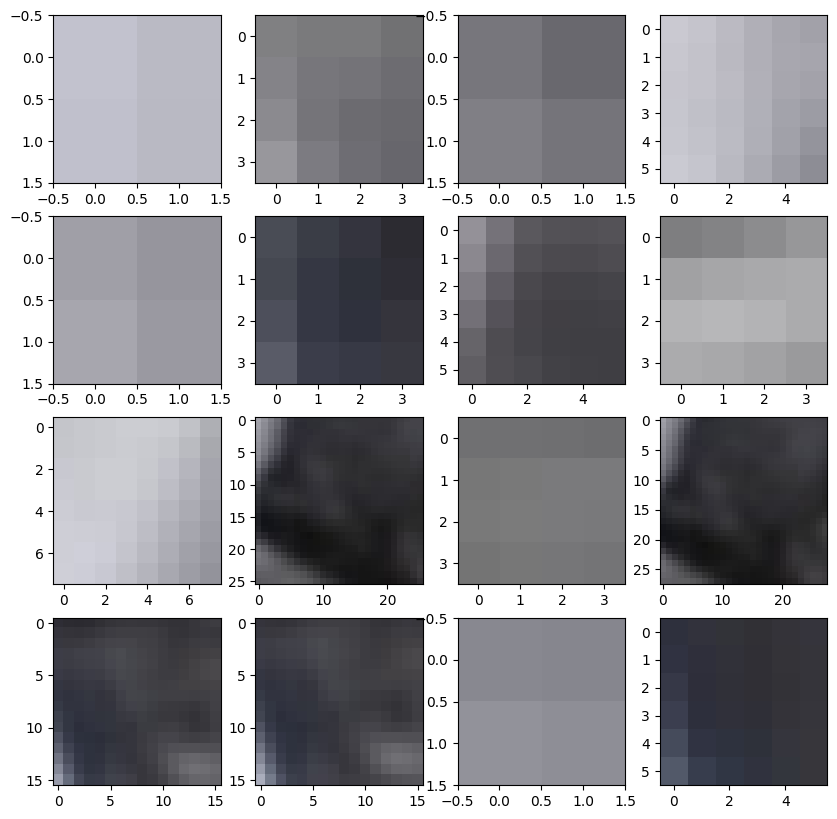

In [228]:
# Visualisation des 'Visual words'
fonctions_data.afficher_vwords(montre, sift_keypoints)

##### <span style='background:gold'>3.3.1.2 SIFT pour les 200 images du dataframe</span>

**E1 - Chargement des images prétraités**

In [230]:
# Chargement des images pré-traitées dans le dictionnaire images

dico_img = fonctions_data.charger_images_repertoire('Data/Flipkart/Images', nombre_images=300)
#charger_image_repertoire('Data/Flipkart/Images')
print(f'{len(dico_img)} images chargées')

300 images chargées


**E2 - Extraction des features - Visual Words**

In [232]:
sifts = fonctions_data.sift_extraire_features(dico_img)

In [233]:
# # Liste des descripteurs = tous les 'visual words' de toutes les images
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

2801055

In [234]:
# Liste des vecteurs par images (dictionnaires clé=nom_image, vecteur)
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

300

**E3 - Création du dictionnaire de visual words : Bag of Visual Words (BoVW)**

In [ ]:
# Initialisation du dataframe de sauvegarde des métriques kmeans
df_kmeans_metrics = pd.DataFrame({})
nb_clusters = [100, 300, 500, 1000, 2000, 3000, 4000, 5000]

df_kmeans_metrics = fonctions_data.calcul_metrics_kmeans(sift_list_descripteurs,
                                        df_kmeans_metrics,
                                        'SIFT', nb_clusters)

'Paramètre 100 terminé'

'Paramètre 300 terminé'

KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 179, in where
KeyboardInterrupt: 


**Méthode Elbow**

In [ ]:
# Trace le graphique des dispersions, pour visualiser le coude
plt.figure(figsize=(12, 5))

plt.title('La méthode Elbow', fontsize=16)
plt.plot([i for i in nb_clusters],
         df_kmeans_metrics['dispersion'].to_list(),
         marker='o')
plt.grid(True)
plt.xlabel('Nombre de groupes', fontsize=14)
plt.ylabel('Score de dispersion', fontsize=15)
plt.xticks([i for i in nb_clusters], fontsize=14)
plt.yticks(fontsize=15)

plt.show()

In [236]:
# Creation des clusters via MiniBatch et Constitution du dictionnaire de bag of words
sift_kmeans = MiniBatchKMeans(n_clusters=1000,
                     random_state=0, n_init=10)
sift_kmeans.fit(sift_list_descripteurs)
sift_visual_words = sift_kmeans.cluster_centers_

In [237]:
sift_visual_words

array([[27.42684856, 26.31198102, 22.91083432, ..., 15.38770265,
        14.37584025, 14.44998023],
       [38.21799249, 19.46773643,  7.75674292, ...,  1.56111301,
         1.36497098, 16.45373848],
       [24.9466062 , 15.93373318, 12.03335284, ..., 15.07665301,
        12.27296665, 13.16939731],
       ...,
       [41.50912176, 17.4427238 , 11.17628341, ...,  5.99724226,
         6.71616462,  7.34641493],
       [95.50560678, 51.71168702, 18.3511089 , ..., 34.88711687,
        12.69100424,  7.19063045],
       [32.66683884, 33.59194215, 28.94163223, ..., 27.31818182,
        29.94860537, 13.32463843]])

**E4 - Construction de l'histogramme pour chaque image**

In [239]:
sift_bovw = fonctions_data.image_class(sift_all_bovw_features, sift_visual_words)

In [240]:
len(sift_bovw)

300

In [268]:
# Dataframe  des BoVW SIFT
df_sift_bovw = pd.DataFrame({'image': sift_bovw.keys(),'sift_bovw': sift_bovw.values()})

# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histogramme'] = [row[0] for row in df_sift_bovw['sift_bovw']] 
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(data_imc[['image', 'image_loc',
                                        'Categorie_1']], how='left', on='image')

# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors = fonctions_data.constituer_dataframe_vectors(df_sift_bovw, 'Histogramme')

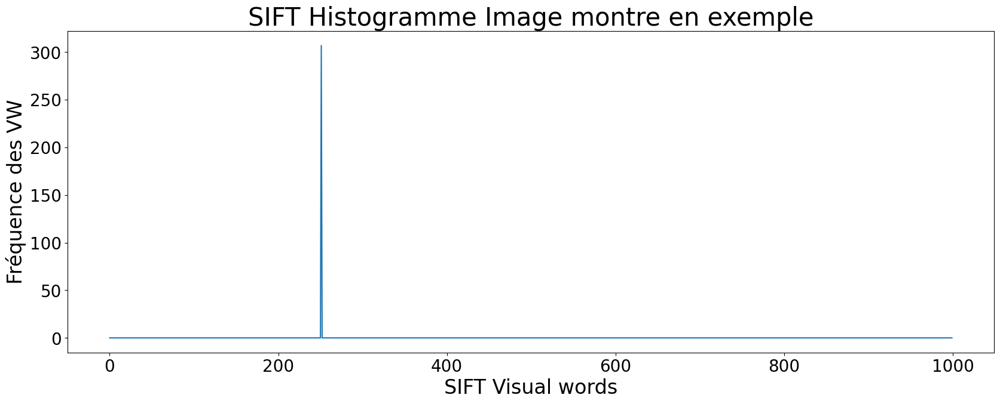

In [269]:
# Visualisation de l'histogramme pour l'image exemple de l'elephant

# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image'] ==
                       '00e966a5049a262cfc72e6bbf68b80e7.jpg']['sift_bovw']   
histo_eleph = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image montre en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_eleph)
plt.savefig('histogram elephant',dpi=200, bbox_inches='tight')
plt.show()

**E5 - Réduction de dimension**

In [169]:
df_sift_vectors.shape[1]

1000

In [26]:
data_cat = data_work['category']

-----------------------------------------
 ARI  : 0.0037
 Homogénéité  : 0.0465
-----------------------------------------


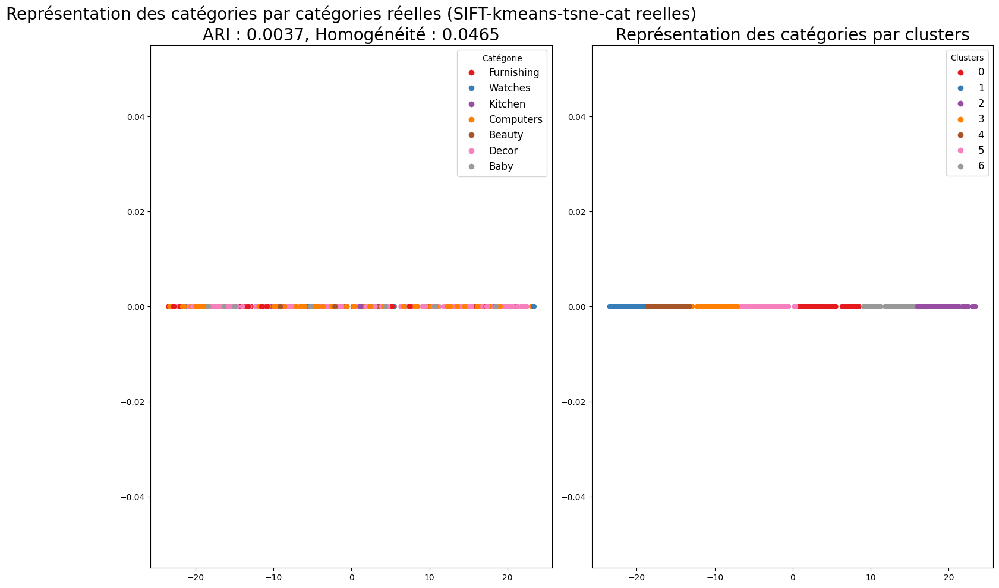

In [271]:
title = 'SIFT-kmeans-tsne-cat reelles'

# TSNE/Kmeans/visualisation

# Calcul des composantes TSNE

df_sift_vectors_tsne = fonctions_data.tsne(df_sift_vectors, 40)

# kmeans
df_sift_vectors_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_sift_vectors_tsne, data_cat)

# Visualisation
fonctions_data.affiche_projection_par_clusters(df_sift_vectors_tsne_km, labels, ARI, Homogeneite, title)

In [288]:
# Les catégories par clusters
df_sift_vectors_tsne_km.groupby('cluster_id')['categories'].value_counts().to_frame()

categories
cluster_id categories            
0          Kitchen             17
           Decor               13
           Watches             10
           Baby                 5
           Furnishing           4
           Beauty               2
           Computers            2
1          Kitchen             14
           Decor               12
           Baby                 6
           Watches              5
           Beauty               2
           Computers            1
2          Kitchen             21
           Baby                 7
           Decor                7
           Beauty               4
           Watches              3
           Computers            1
           Furnishing           1
3          Kitchen             14
           Decor               10
           Computers            5
           Baby                 4
           Beauty               4
           Furnishing           2
           Watches              2
4          Kitchen             15
           Watches              8
           Decor                5
           Baby                 3
           Furnishing           3
           Beauty               1
5          Decor               17
           Kitchen             12
           Furnishing           6
           Baby                 2
           Beauty               2
           Watches              2
           Computers            1
6          Kitchen             19
           Decor               11
           Watches              6
           Furnishing           5
           Beauty               3
           Baby                 1

Clusters,Nombre,%
0,53,17.670000
1,40,13.330000
2,44,14.670000
3,41,13.670000
4,35,11.670000
5,42,14.000000
6,45,15.000000


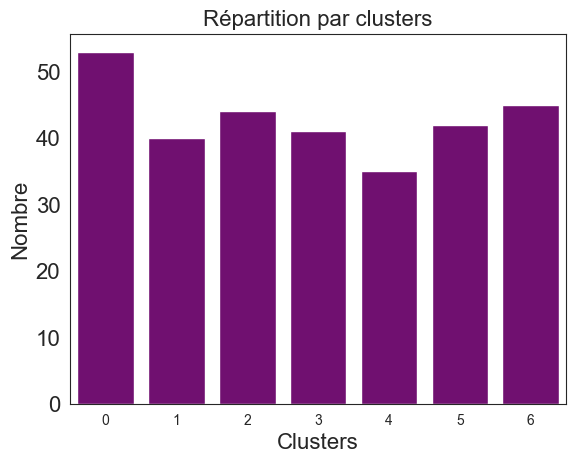

In [305]:
fonctions_data.affiche_repartition_par_clusters(labels)

,precision,recall,f1-score,support
0,0.000000,0.000000,0.000000,28.00
1,0.000000,0.000000,0.000000,18.00
2,0.000000,0.000000,0.000000,10.00
3,0.404762,0.226667,0.290598,75.00
4,0.000000,0.000000,0.000000,21.00
5,0.387597,0.892857,0.540541,112.00
6,0.000000,0.000000,0.000000,36.00
accuracy,0.390000,0.390000,0.390000,0.39
macro avg,0.113194,0.159932,0.118734,300.00
weighted avg,0.245893,0.390000,0.274451,300.00


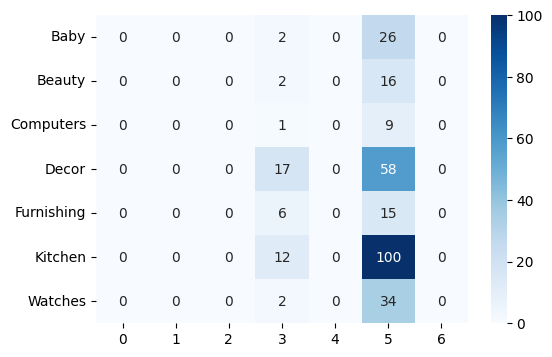

In [273]:
fonctions_data.conf_mat_metrics(df_sift_vectors_tsne_km)

#### <span style='background:wheat'>3.3.2 Algorithme ORB</span>

 **ORB** (Oriented FAST and Rotated BRIEF) a été conçu principalement parce que SIFT et SURF sont des algorithmes brevetés. ORB, cependant, est libre d'utilisation.
- ORB est aussi performant que SIFT pour la détection des caractéristiques (et est meilleur que SURF) tout en étant presque deux ordres de grandeur plus rapide.
- ORB s'appuie sur le célèbre détecteur de points clés FAST et le descripteur BRIEF. Ces deux techniques sont intéressantes en raison de leurs bonnes performances et de leur faible coût. 
- Les principales contributions d'ORB sont les suivantes :
    - L'ajout d'une composante d'orientation rapide et précise à FAST.
    - Le calcul efficace des caractéristiques BRIEF orientées
    - L'analyse de la variance et de la corrélation des caractéristiques BRIEF orientées
    - Une méthode d'apprentissage pour la décorrélation des caractéristiques BRIEF sous invariance rotationnelle, conduisant à de meilleures performances dans les applications de type "nearest-neighbor".

**Exemple avec l'image précédente**

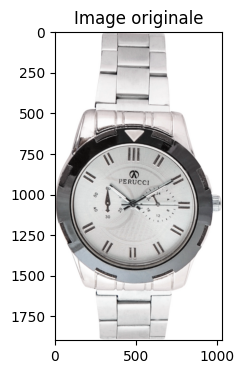

In [217]:
# Chargement de l'image précédemment traitée
montre = cv2.imread('Data/Flipkart/Images/fc93a41f31c4e997fbfcc5bd0a63ee65.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(montre)
plt.show()

##### <span style='background:gold'>3.3.2.1 Extraction des features (BOVW-Bag of Visual Words)</span>

In [343]:
# Transformation del'image en matrice de pixels pour OpenCV
montre = np.array(montre)
# Instanciation de ORB
orb = cv2.ORB_create()
# Extraction des points d'intérêt et des descripteurs
orb_keypoints, orb_descripteurs = orb.detectAndCompute(montre, None)
nb_feat = orb_descripteurs.shape[0]
nb_desc = orb_descripteurs.shape[1]
print(f'ORB Montre - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

ORB Montre - Nombre de features=500 pour 32 descripteurs


In [344]:
orb_descripteurs

array([[ 26,  10, 230, ..., 108,  61, 138],
       [ 42, 132,  44, ...,  12, 221, 138],
       [ 30,  92, 224, ..., 223,  60, 246],
       ...,
       [185, 201,  71, ..., 187, 112, 172],
       [147, 203,  66, ..., 156, 249, 157],
       [ 51,  11,  66, ..., 143, 112, 204]], dtype=uint8)

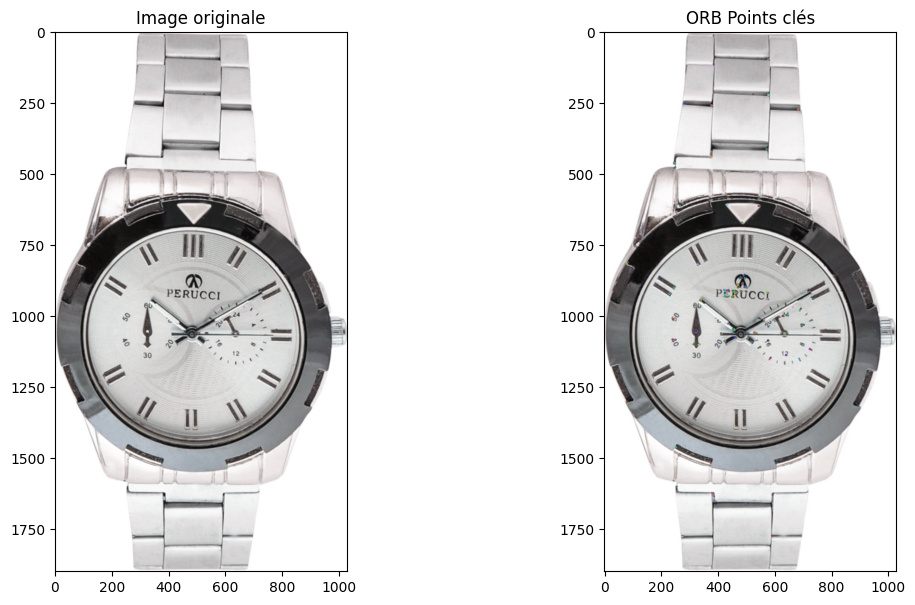

In [307]:
# Visualisation des points d'intérêt
orb_montre_keypoints = cv2.drawKeypoints(montre, orb_keypoints, None)

plt.figure(figsize=(13, 7))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(montre)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(orb_montre_keypoints)
plt.title('ORB Points clés')
plt.show()

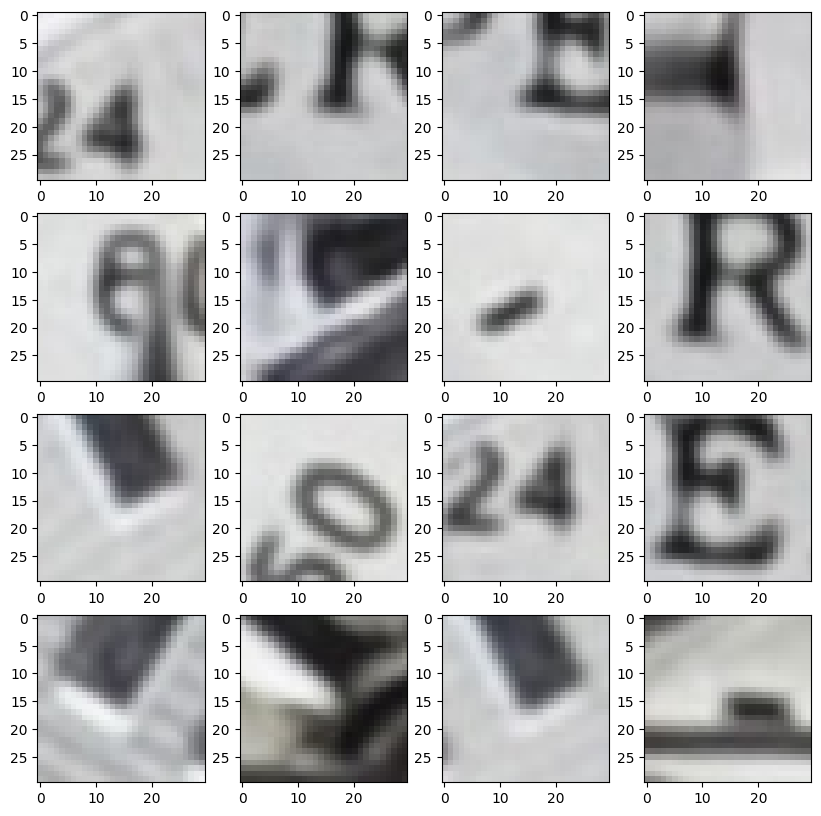

In [308]:
# Visualisation des 'Visual words'
fonctions_data.afficher_vwords(montre, orb_keypoints)

##### <span style='background:gold'>3.3.2.2 ORB pour les 1000 images du dataframe</span>

**E1 - Chargement des images prétraités**

In [182]:
# Chargement des images pré-traitées dans le dictionnaire images

dico_img_orb = fonctions_data.charger_images_repertoire('Data/Flipkart/Images', nombre_images=1000)
#charger_image_repertoire('Data/Flipkart/Images')
print(f'{len(dico_img_orb)} images chargées')

1000 images chargées


**E2 - Extraction des features - Visual Words**

In [217]:
orb_list_descripteurs, orb_lien_img_des = fonctions_data.orb_extract_features(data_imc_t['image_process2'])

In [218]:
orb_list_descripteurs.shape

(735579, 32)

In [219]:
len(orb_lien_img_des)

735579

**E3 - Création du dictionnaire de visual words : Bag of Visual Words (BoVW)**

- Pour créer le "dictionnaire" de visual words, il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 1, comme l'algorithme MiniBatchKMeans, par exemple. 
- Les visual words correspondent alors aux centres des clusters trouvés.

In [224]:
# Test du MiniBatchKMeans mis à disposition

# Création d'un objet MiniBatchKMeans avec le nombre de clusters désiré
kmeans = MiniBatchKMeans(n_clusters=1000)

# Entraînement du modèle sur les données
kmeans.fit(orb_list_descripteurs)

MiniBatchKMeans(n_clusters=1000)

In [230]:
#  Obtenir les labels des clusters pour chaque descripteur
orb_labels = kmeans.predict(orb_list_descripteurs)

In [231]:
orb_labels.shape

(735579,)

**E4 - Construction de l'histogramme pour chaque image**

- Pour chaque image, on crée un histogramme qui indique la fréquence d'apparition de chaque visual word dans l'image.- 
Le bag-of-features d'une image est le vecteur dans lequel on a stocké les valeurs de l'histogramme et qu'on a normalisé (en divisant par la norme euclidienne).

In [235]:
# Extraction des BOVW ORB
df_orb_vectors = fonctions_data.orb_constituter_bovw(data_imc_t, 'image_process2', 'orb_bovw',
                                   orb_labels, orb_lien_img_des)

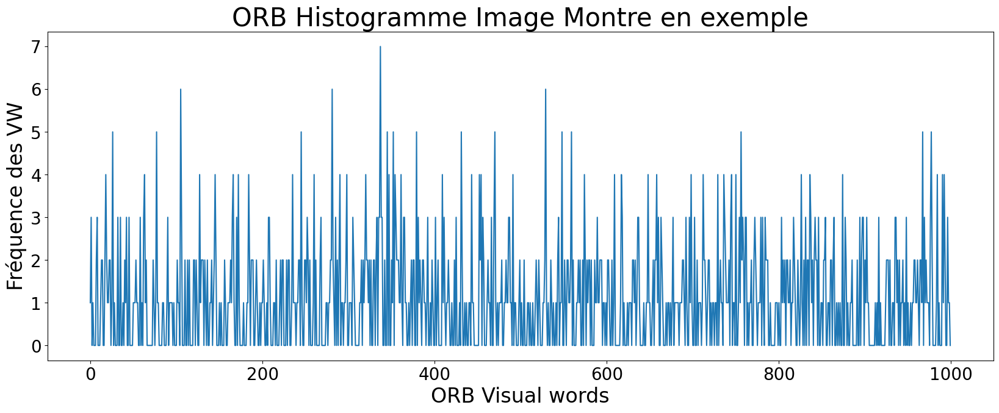

In [237]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu_orb = data_imc_t[data_imc_t['image'] ==
                   'fc93a41f31c4e997fbfcc5bd0a63ee65.jpg']['orb_bovw']
histo_montre = df_visu_orb.to_list()[0]
plt.figure(figsize=(20, 7))
plt.title('ORB Histogramme Image Montre en exemple', fontsize=30)
plt.xlabel('ORB Visual words', fontsize=24)
plt.ylabel('Fréquence des VW', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

In [238]:
# Dataframe de sauvegarde des BOVW ORB
df_orb_bovw = data_imc_t[['image', 'image_loc', 'Categorie_1', 'orb_bovw']]
# Constituer le dataframe de vecteurs de BOVW
df_orb_vectors = fonctions_data.constituer_dataframe_vectors(df_orb_bovw, 'orb_bovw')

In [241]:
df_orb_vectors

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,2.0,0.0,1.0,0.0,0.0,6.0,1.0,2.0,2.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.0,2.0
3,0.0,1.0,2.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2.0,0.0,3.0,0.0,2.0,0.0,2.0,1.0,2.0,1.0
4,7.0,2.0,2.0,2.0,2.0,0.0,2.0,1.0,0.0,1.0,...,0.0,0.0,0.0,4.0,1.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,2.0,1.0,2.0,5.0,0.0,0.0,2.0,1.0,4.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,2.0,0.0,0.0,1.0
1046,0.0,0.0,0.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1047,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,2.0,0.0,...,4.0,0.0,1.0,3.0,2.0,0.0,0.0,1.0,5.0,1.0
1048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0


**E5 - Réduction de dimension**

In [239]:
df_orb_vectors.shape[1]

1000

Nombre de features après réduction ACP pour 99.0% de variance : 701
-----------------------------------------
 ARI  : 0.0349
 Homogénéité  : 0.0635
-----------------------------------------


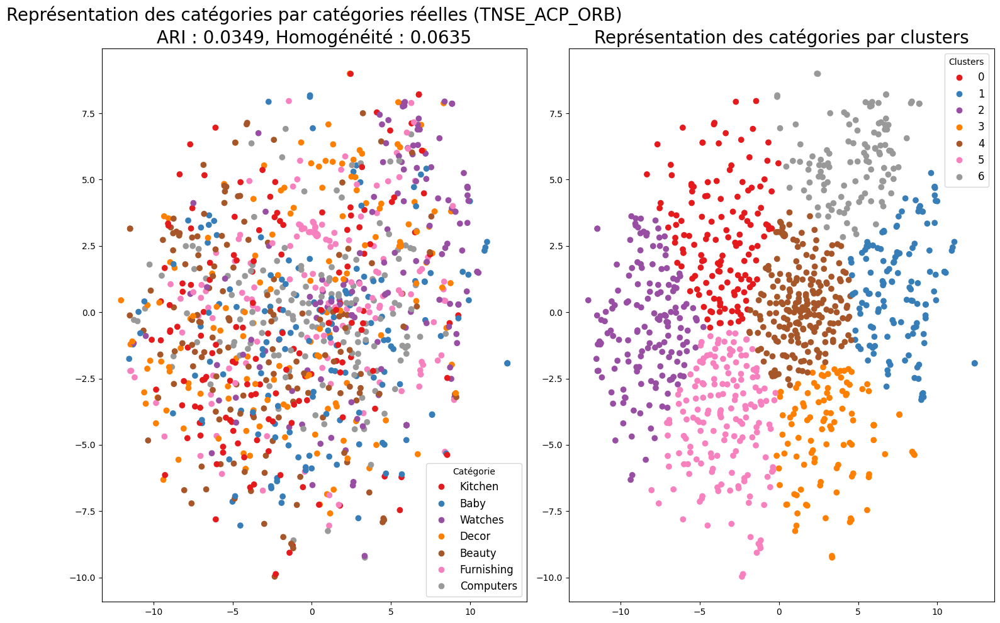

In [255]:
# Reduction ACP/TSNE/Kmeans/visualisation
title = 'TNSE_ACP_ORB'

# reduction ACP (99% de variance)
df_orb_vectors_acp = fonctions_data.acp(df_orb_vectors)

# Calcul des composantes TSNE

df_orb_vectors_acp_tsne = fonctions_data.tsne(df_orb_vectors_acp, 40)

# kmeans
df_orb_vectors_acp_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_orb_vectors_acp_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_orb_vectors_acp_tsne_km, labels, ARI, Homogeneite, title)

In [256]:
# Les catégories par clusters
df_orb_vectors_acp_tsne_km.groupby('cluster_id')['categories'].value_counts().to_frame()

categories
cluster_id categories            
0          Furnishing          26
           Baby                24
           Kitchen             24
           Watches             24
           Decor               18
           Beauty              16
           Computers            5
1          Computers           45
           Kitchen             22
           Beauty              21
           Watches             20
           Decor               18
           Furnishing           7
           Baby                 5
2          Furnishing          42
           Decor               33
           Baby                32
           Kitchen             16
           Watches             16
           Beauty              13
           Computers            5
3          Beauty              25
           Computers           19
           Decor               17
           Furnishing          16
           Watches             16
           Baby                 9
           Kitchen              9
4          Kitchen             53
           Watches             50
           Beauty              33
           Computers           29
           Baby                25
           Decor               17
           Furnishing          16
5          Baby                40
           Furnishing          39
           Beauty              31
           Decor               21
           Watches             15
           Kitchen             12
           Computers           11
6          Computers           36
           Decor               26
           Baby                15
           Kitchen             14
           Beauty              11
           Watches              9
           Furnishing           4

,precision,recall,f1-score,support
0,0.236686,0.266667,0.250784,150.000000
1,0.225225,0.166667,0.191571,150.000000
2,0.320158,0.540000,0.401985,150.000000
3,0.000000,0.000000,0.000000,150.000000
4,0.231293,0.453333,0.306306,150.000000
5,0.237668,0.353333,0.284182,150.000000
6,0.000000,0.000000,0.000000,150.000000
accuracy,0.254286,0.254286,0.254286,0.254286
macro avg,0.178719,0.254286,0.204975,1050.000000
weighted avg,0.178719,0.254286,0.204975,1050.000000


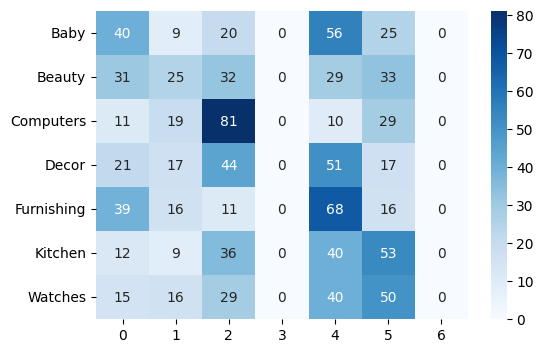

In [257]:
fonctions_data.conf_mat_metrics(df_orb_vectors_acp_tsne_km)

La visualisation ainsi que l'indice de similarité montrent clairement qu'on arrive pas à séparer les catégories et par conséquent les classifier en utilisant l'algorithme ORB pour l'extraction des features des images et le calcul des descripteurs

### <span style='background:orange'>3.4. Convolutional Neural Networks (CNN) transfer learning</span>

#### <span style='background:wheat'>3.4.1 VGG16</span>

**VGG16** est un réseau neuronal convolutif entraîné sur des millions d'images de catégorie différente.

Ce modèle fonctionne avec un système imbriqué de 3*3 couches convolutives. Chaque couche est centrée sur un élément graphique, et possède **16 couches**. 

In [441]:
# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine non traitées

top_depart = time.time()

# Liste
vgg16_all_features = []

# Pre-Trained Model as Feature Extractor in Model

model_vgg16  = VGG16(weights='imagenet', include_top=False,  classes=7, pooling='avg', input_shape=(224,224,3)) 

# Résumé de l'architecture du modèle
model_vgg16.summary()

for rep_image in data_imc_t['image_loc']:

    # Charger l'image et la redimensionner à la taille requise de 224×224 pixels
    img = image.load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler dans Keras
    img = image.img_to_array(img)
    
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance de l'image à chacun des 1000 types d'objets connus
    vgg16_feature = model_vgg16.predict(img)
    
    # Ajouter la feature prédite en nparray à la liste 
    vgg16_all_features.append(np.array(vgg16_feature).flatten()) # Conversion des matrices 3D en vecteur 1D

vgg16_all_features = np.array(vgg16_all_features)

print(f"Temps d'execution : {round((time.time()-top_depart)/60, 3)} minutes")

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [442]:
vgg16_all_features.shape 

(1050, 512)

In [443]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
data_imc_t['vgg16_bovw'] = [vgg16_all_features[i] for i in range(data_imc_t.shape[0])]
# Dataframe de travail
df_vgg16_bovw = data_imc_t[['image', 'image_loc', 'Categorie_1', 'vgg16_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)

**Réduction de dimension**

**ACP/TSNE/kmeans** 

Nombre de features après réduction ACP pour 99.0% de variance : 351
-----------------------------------------
 ARI  : 0.4755
 Homogénéité  : 0.557
-----------------------------------------


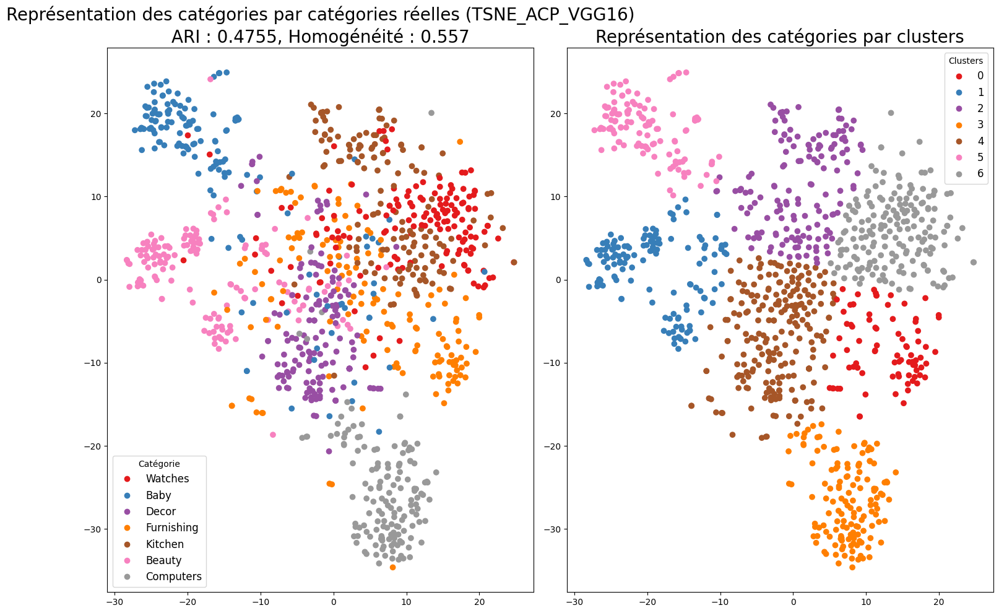

In [444]:
title = 'TSNE_ACP_VGG16'
# Réduction ACP pour 99% de variance

df_vgg16_vectors_acp = fonctions_data.acp(df_vgg16_vectors)

# Calcul des composantes TSNE.
df_vgg16_vectors_acp_tsne = fonctions_data.tsne(df_vgg16_vectors_acp, 50)

# kmeans
df_vgg16_vectors_acp_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_vgg16_vectors_acp_tsne, data_cat)

# Visualisation
fonctions_data.affiche_projection_par_clusters(df_vgg16_vectors_acp_tsne_km, labels, ARI, Homogeneite, title)

**Sans l'étape de réduction d'ACP**

-----------------------------------------
 ARI  : 0.3846
 Homogénéité  : 0.498
-----------------------------------------


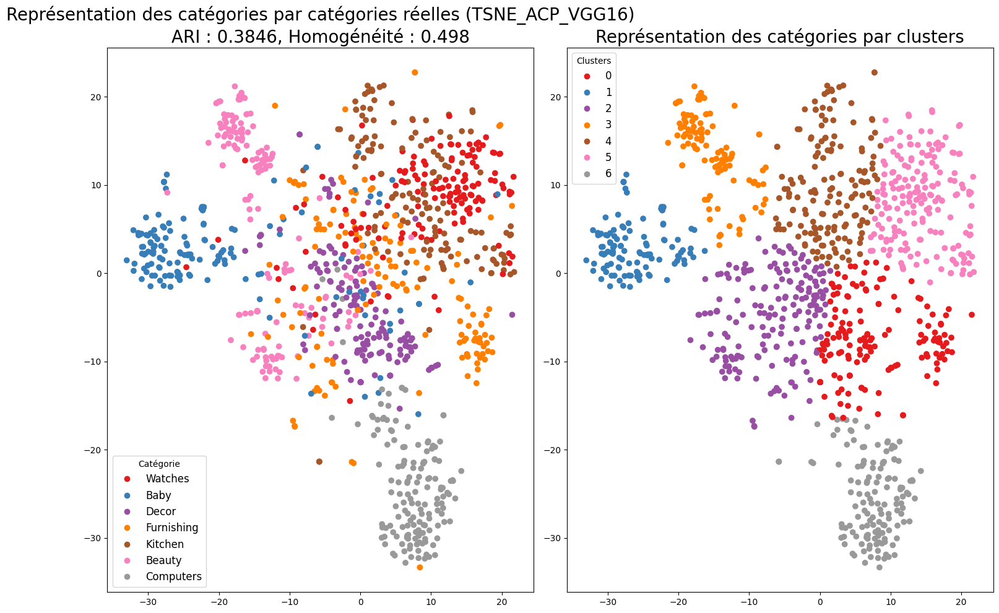

In [449]:
# Calcul des composantes TSNE
df_vgg16_vectors_tsne = fonctions_data.tsne(df_vgg16_vectors, 50)

# kmeans
df_vgg16_vectors_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_vgg16_vectors_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_vgg16_vectors_tsne_km, labels, ARI, Homogeneite, title)

,precision,recall,f1-score,support
0,0.580645,0.720000,0.642857,150.000000
1,0.923729,0.726667,0.813433,150.000000
2,0.552632,0.840000,0.666667,150.000000
3,0.756098,0.413333,0.534483,150.000000
4,0.474359,0.493333,0.483660,150.000000
5,0.878571,0.820000,0.848276,150.000000
6,0.964286,0.900000,0.931034,150.000000
accuracy,0.701905,0.701905,0.701905,0.701905
macro avg,0.732903,0.701905,0.702916,1050.000000
weighted avg,0.732903,0.701905,0.702916,1050.000000


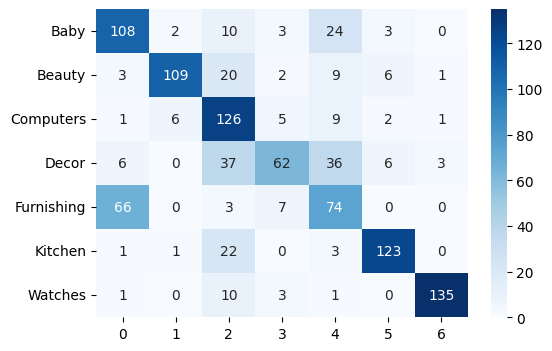

In [451]:
fonctions_data.conf_mat_metrics(df_vgg16_vectors_acp_tsne_km)

#### <span style='background:wheat'>3.4.2 VGG19</span>

**VGG19** est un réseau neuronal convolutif entraîné sur des millions d'images de catégorie différente, et une amélioration du modèle **VGG16**

Ce modèle fonctionne avec un système imbriqué de 3*3 couches convolutives. Chaque couche est centrée sur un élément graphique, et possède maintenant **19 couches au lieu de 16**. 

In [455]:
from keras.applications.vgg19 import VGG19

# Utilisation de VGG16 pré-entraîné sur ImageNet avec les images d'origine non traitées

top_depart = time.time()

# Liste
vgg19_all_features = []

# Pre-Trained Model as Feature Extractor in Model

model_vgg19  = VGG19(weights='imagenet', include_top=False,  classes=7, pooling='avg', input_shape=(224,224,3)) 

# Résumé de l'architecture du modèle
model_vgg19.summary()

for rep_image in data_imc_t['image_loc']:

    # Charger l'image et la redimensionner à la taille requise de 224×224 pixels
    img = image.load_img(rep_image, target_size=(224, 224))
    
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler dans Keras
    img = image.img_to_array(img)
    
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    
    # Préparer de nouvelles entrées pour le réseau
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance de l'image à chacun des 1000 types d'objets connus
    vgg19_feature = model_vgg19.predict(img)
    
    # Ajouter la feature prédite en nparray à la liste 
    vgg19_all_features.append(np.array(vgg19_feature).flatten()) # Conversion des matrices 3D en vecteur 1D

vgg19_all_features = np.array(vgg19_all_features)

print(f"Temps d'execution : {round((time.time()-top_depart)/60, 3)} minutes")

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [456]:
vgg19_all_features.shape 

(1050, 512)

In [458]:
# Dataframe de sauvegarde des BOVW VGG16
# Association des features à chaque image
data_imc_t['vgg19_bovw'] = [vgg19_all_features[i] for i in range(data_imc_t.shape[0])]
# Dataframe de travail
df_vgg19_bovw = data_imc_t[['image', 'image_loc', 'Categorie_1', 'vgg19_bovw']]
# Constituer le dataframe de vecteurs de BOVW VGG16
df_vgg19_vectors = pd.DataFrame.from_records(vgg19_all_features)

**Réduction de dimension**

**ACP/TSNE/kmeans**

Nombre de features après réduction ACP pour 99.0% de variance : 347
-----------------------------------------
 ARI  : 0.4597
 Homogénéité  : 0.5479
-----------------------------------------


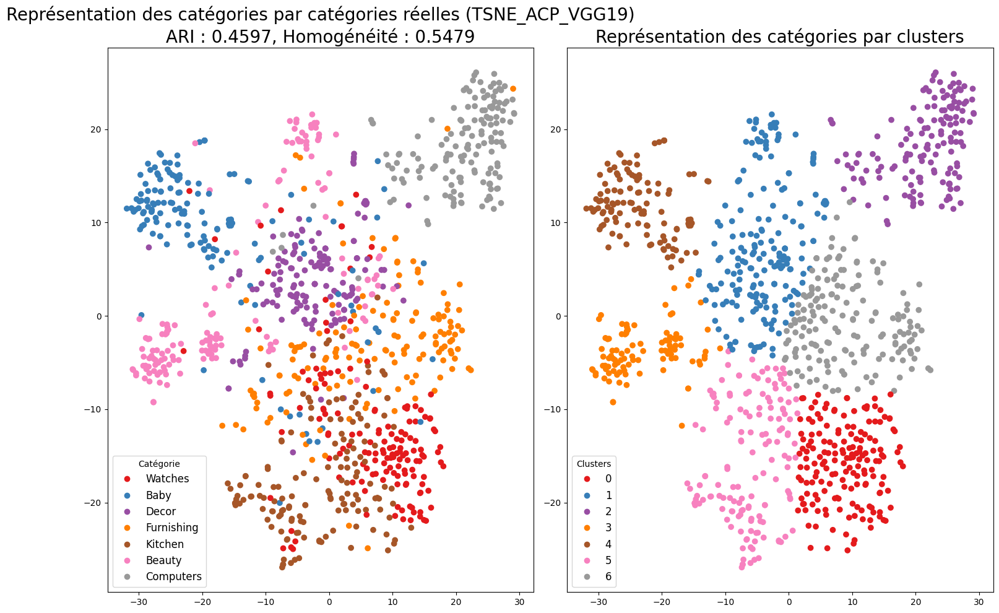

In [461]:
title = 'TSNE_ACP_VGG19'
# Réduction ACP pour 99% de variance

df_vgg19_vectors_acp = fonctions_data.acp(df_vgg19_vectors)

# Calcul des composantes TSNE.
df_vgg19_vectors_acp_tsne = fonctions_data.tsne(df_vgg19_vectors_acp, 50)

# kmeans
df_vgg19_vectors_acp_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_vgg19_vectors_acp_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_vgg19_vectors_acp_tsne_km, labels, ARI, Homogeneite, title)

**Sans l'étape de réduction d'ACP**

-----------------------------------------
 ARI  : 0.4501
 Homogénéité  : 0.5326
-----------------------------------------


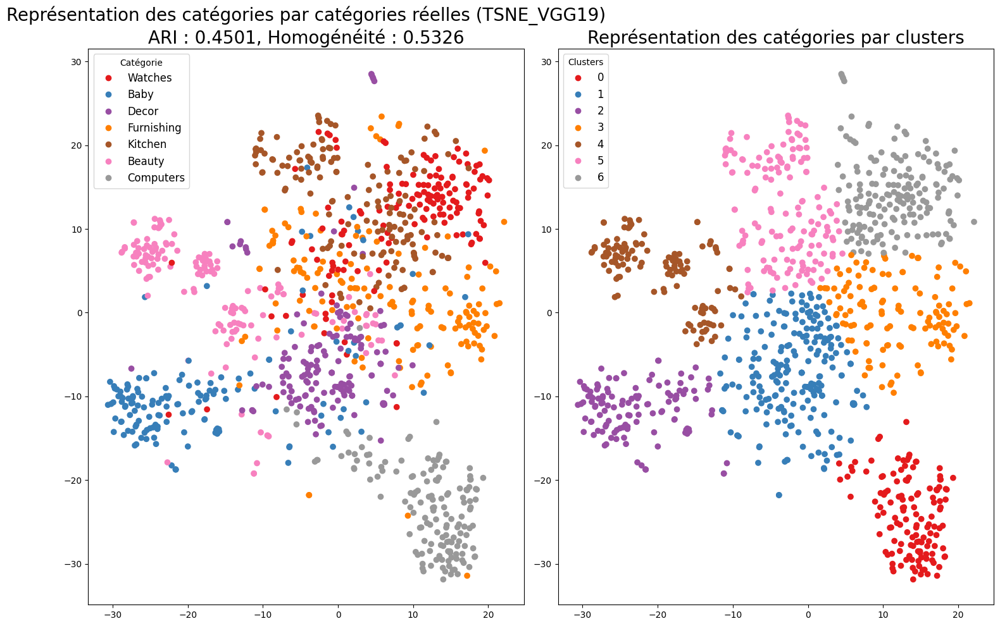

In [463]:
title = 'TSNE_VGG19'
# Calcul des composantes TSNE
df_vgg19_vectors_tsne = fonctions_data.tsne(df_vgg19_vectors, 50)

# kmeans
df_vgg19_vectors_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_vgg19_vectors_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_vgg19_vectors_tsne_km, labels, ARI, Homogeneite, title)

,precision,recall,f1-score,support
0,0.603550,0.680000,0.639498,150.000000
1,0.949153,0.746667,0.835821,150.000000
2,0.551020,0.720000,0.624277,150.000000
3,0.554913,0.640000,0.594427,150.000000
4,0.557823,0.546667,0.552189,150.000000
5,0.836735,0.546667,0.661290,150.000000
6,0.966443,0.960000,0.963211,150.000000
accuracy,0.691429,0.691429,0.691429,0.691429
macro avg,0.717091,0.691429,0.695816,1050.000000
weighted avg,0.717091,0.691429,0.695816,1050.000000


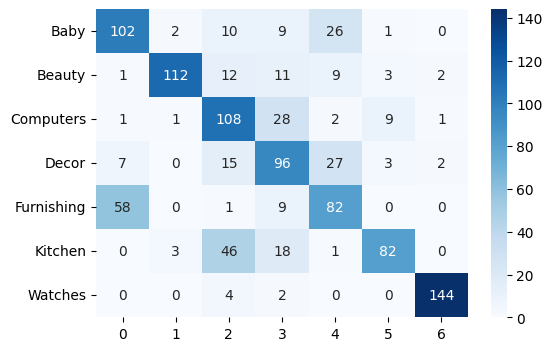

In [464]:
fonctions_data.conf_mat_metrics(df_vgg19_vectors_acp_tsne_km)

#### <span style='background:wheat'>3.4.3 InceptionV3</span>

**Inception V3** est un réseau de neurones convolutif développé pour l'analyse d'images et la détection d'objets. Il a débuté comme un module pour Googlenet. Il s'agit de la troisième édition du réseau de neurones convolutif Inception de Google, initialement présenté lors du défi de reconnaissance ImageNet.

Tout comme ImageNet peut être considéré comme une base de données d'objets visuels classés, Inception v3 aide à la classification d'objets dans le monde de la vision par ordinateu.
inateur.



In [18]:
# Utilisation de InceptionV3 pré-entraîné sur ImageNet avec les images
# d'origine
# InceptionV3 imports
from keras.applications.inception_v3 import preprocess_input
from keras.applications import InceptionV3


top_depart = time.time()

# Liste
incep_all_features = []

# Instanciation du modèle
model_incep = InceptionV3(weights='imagenet', include_top=False,  pooling='avg')#classes=7,
# Résumé de l'architecture du modèle
model_incep.summary()

for rep_image in data_imc_t['image_loc']:

    # Charger l'image et la redimensionner à la taille
    # requise de 299x299 pixels. le redimensionnement 224x224 a donné meilleur resultat
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    incep_feature = model_incep.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incep_all_features.append(np.array(incep_feature).flatten())

incep_all_features = np.array(incep_all_features)    
print(f"Temps d'execution : {round((time.time()-top_depart)/60, 3)} minutes")

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, None, None, 32)       864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, None, None, 32)       96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, None, None, 32)       0         ['batch_normalizati

In [19]:
incep_all_features.shape

(1050, 2048)

In [20]:
# Dataframe de sauvegarde des BOVW InceptionV3
# Association des features à chaque image
data_imc_t['incep_bovw'] = \
    [incep_all_features[i] for i in range(data_imc_t.shape[0])]
# Dataframe de travail
df_incep_bovw = data_imc_t[['image', 'image_loc', 'Categorie_1', 'incep_bovw']]
 
# Constituer le dataframe de vecteurs de BOVW InceptionV3
df_incep_vectors = pd.DataFrame.from_records(incep_all_features)

**Réduction de dimension**

**TSNE/Kmeans**

Nombre de features après réduction ACP pour 99.0% de variance : 715
-----------------------------------------
 ARI  : 0.5434
 Homogénéité  : 0.5855
-----------------------------------------


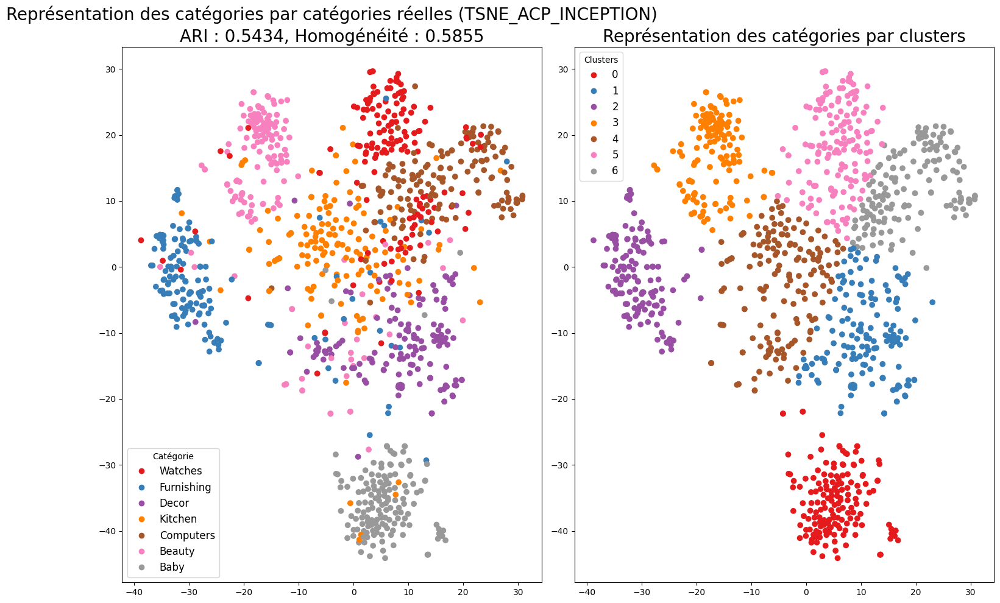

In [36]:
title = 'TSNE_ACP_INCEPTION'

# Réduction ACP pour 99% de variance

df_incep_vectors_acp_tsne = fonctions_data.acp(df_incep_vectors)

# Calcul des composantes TSNE
df_incep_vectors_acp_tsne = fonctions_data.tsne(df_incep_vectors_acp_tsne, 40)

# kmeans
df_incep_vectors_acp_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_incep_vectors_acp_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_incep_vectors_acp_tsne_km, labels, ARI, Homogeneite, title)

**Sans l'étape de réduction d'ACP**

-----------------------------------------
 ARI  : 0.5323
 Homogénéité  : 0.5892
-----------------------------------------


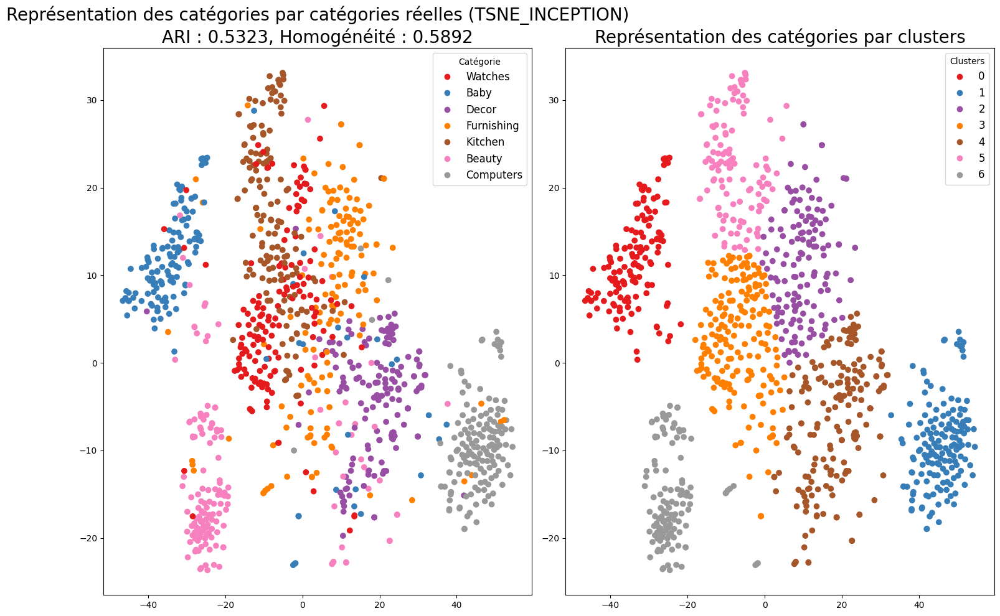

In [571]:
title = 'TSNE_INCEPTION'
# Calcul des composantes TSNE
df_incep_vectors_tsne = fonctions_data.tsne(df_incep_vectors, 40)

# kmeans
df_incep_vectors_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_incep_vectors_tsne, data_cat)

# visualisation
fonctions_data.affiche_projection_par_clusters(df_incep_vectors_tsne_km, labels, ARI, Homogeneite, title)

,precision,recall,f1-score,support
0,0.600000,0.600000,0.600000,150.000000
1,0.890511,0.813333,0.850174,150.000000
2,0.770701,0.806667,0.788274,150.000000
3,0.569697,0.626667,0.596825,150.000000
4,0.688742,0.693333,0.691030,150.000000
5,0.877863,0.766667,0.818505,150.000000
6,0.918239,0.973333,0.944984,150.000000
accuracy,0.754286,0.754286,0.754286,0.754286
macro avg,0.759393,0.754286,0.755685,1050.000000
weighted avg,0.759393,0.754286,0.755685,1050.000000


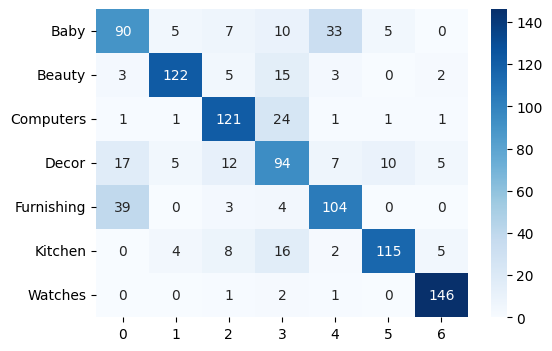

In [479]:
fonctions_data.conf_mat_metrics(df_incep_vectors_acp_tsne_km)

#### <span style='background:wheat'>3.4.4 Combinaison des meilleurs résultats des approches texte et image</span>

**InceptionV3 et TFIDF amélioré (Déscription)**

-----------------------------------------
 ARI  : 0.5539
 Homogénéité  : 0.679
-----------------------------------------


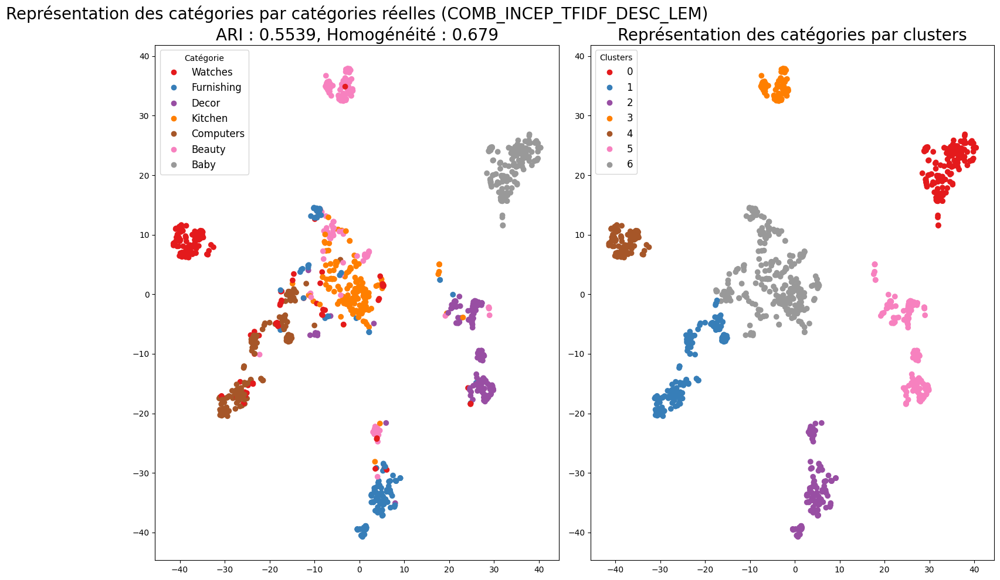

In [38]:
# Concaténation des matrices denses réduites des données textuelles et des images ARI 0.6334
# si jamais on n'a que la variable description et pas le nom du produit :

title = 'COMB_INCEP_TFIDF_DESC_LEM'
df_desc_lem_tf_tsne_freq = pd.read_csv('df_desc_lem_tf_tsne_freq.csv')

df_incep_vectors_acp_tsne.rename(columns = {'DIM1':'VAR1', 'DIM2':'VAR2'}, inplace = True)
df_comb_incep_tfidf_desc = pd.concat([df_desc_lem_tf_tsne_freq, df_incep_vectors_acp_tsne],
                    axis=1) #, ignore_index=True)
 
# Calcul des composantes TSNE
df_comb_incep_tfidf_desc_tsne = fonctions_data.tsne(df_comb_incep_tfidf_desc, 40)

# kmeans
df_comb_incep_tfidf_desc_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_comb_incep_tfidf_desc_tsne, data_cat)


# visualisation
fonctions_data.affiche_projection_par_clusters(df_comb_incep_tfidf_desc_tsne_km, labels, ARI, Homogeneite, title)

,precision,recall,f1-score,support
0,1.000000,0.573333,0.728814,150.00
1,0.781022,0.713333,0.745645,150.00
2,0.831250,0.886667,0.858065,150.00
3,0.498221,0.933333,0.649652,150.00
4,0.801242,0.860000,0.829582,150.00
5,0.986667,0.493333,0.657778,150.00
6,1.000000,1.000000,1.000000,150.00
accuracy,0.780000,0.780000,0.780000,0.78
macro avg,0.842629,0.780000,0.781362,1050.00
weighted avg,0.842629,0.780000,0.781362,1050.00


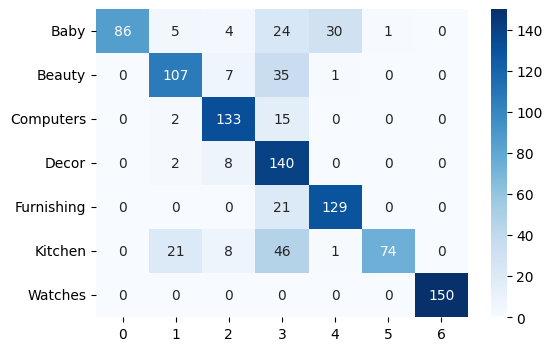

In [574]:
fonctions_data.conf_mat_metrics(df_comb_incep_tfidf_desc_tsne_km)

**USE5 (product_name) et InceptionV3**

**Modelisation USE5** 

**nom_produit** - brut

In [44]:
# Suppression des waring, info
tf.get_logger().setLevel('ERROR')

In [45]:
use_module_url = 'https://tfhub.dev/google/universal-sentence-encoder/3'

In [46]:
# Chargement du modèle
use_model_prod_orig = hub.load(use_module_url)
print('Module %s Chargé' % use_module_url)

Module https://tfhub.dev/google/universal-sentence-encoder/3 Chargé


In [49]:
vector_use_prod = use_model_prod_orig(data_work['product_name'])

In [50]:
vector_use_prod_outputs = vector_use_prod['outputs'].numpy()
vector_use_prod_outputs

array([[ 0.05646455, -0.0166991 , -0.0370861 , ..., -0.01305964,
         0.04983915,  0.06384217],
       [ 0.00599405,  0.05433533, -0.00869234, ..., -0.00258876,
         0.06814882,  0.02568774],
       [ 0.02507095,  0.00259155, -0.0042601 , ..., -0.00587555,
         0.05306112, -0.00711143],
       ...,
       [ 0.05488612,  0.05462695,  0.03137715, ..., -0.03242321,
         0.07352425, -0.06536923],
       [ 0.05647468,  0.03322315,  0.0616175 , ..., -0.02976299,
        -0.01674185, -0.0215883 ],
       [ 0.01983393,  0.06305396,  0.07477679, ..., -0.006964  ,
        -0.02285352, -0.01964251]], dtype=float32)

**Reduction de dimension (TSNE)**

In [51]:
# Dataframe pour réduction de dimension
df_vector_use_prod_outputs = pd.DataFrame(vector_use_prod_outputs)

df_vector_use_prod_acp = fonctions_data.acp(df_vector_use_prod_outputs)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prod = tsne_red.fit_transform(df_vector_use_prod_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prod.shape[1]+1, 1)]
df_use_prod_tf_tsne = pd.DataFrame(X_tsne_use_tf_prod, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 301


-----------------------------------------
 ARI  : 0.6475
 Homogénéité  : 0.7289
-----------------------------------------


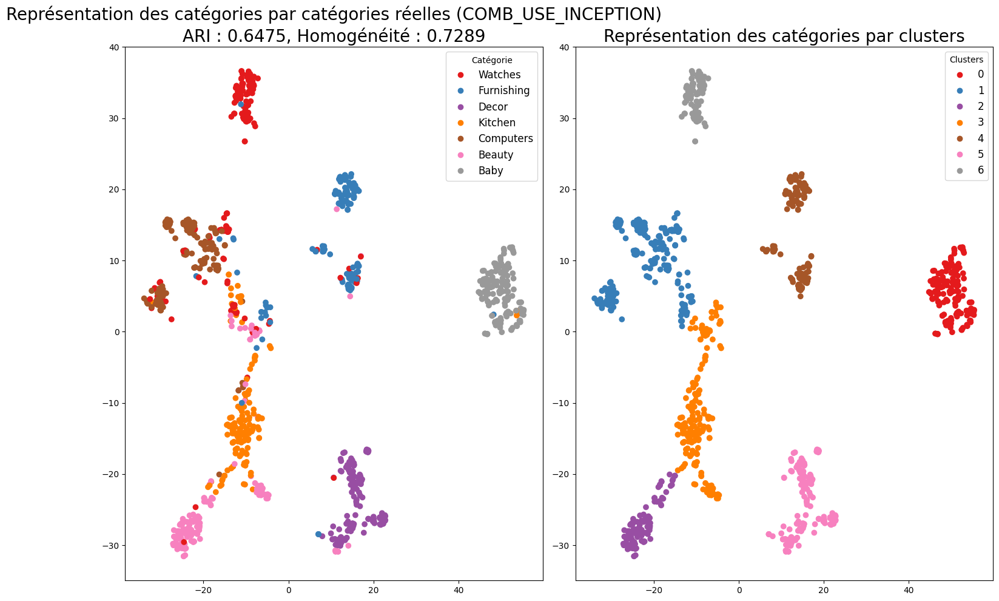

In [53]:
# Concaténation des matrices denses réduites des données textuelles et des images ARI 0.6334
# si jamais on n'a que la variable description et pas le nom du produit :
title = 'COMB_USE_INCEPTION'

df_incep_vectors_acp_tsne.rename(columns = {'DIM1':'VAR1', 'DIM2':'VAR2'}, inplace = True)
df_comb_use_incep = pd.concat([df_use_prod_tf_tsne, df_incep_vectors_acp_tsne],
                    axis=1) #, ignore_index=True)
 
# Calcul des composantes TSNE
df_comb_use_incep_tsne = fonctions_data.tsne(df_comb_use_incep, 40)

# kmeans
df_comb_use_incep_tsne_km, ARI, Homogeneite, labels = fonctions_data.kmeans(df_comb_use_incep_tsne, data_cat)


# visualisation
fonctions_data.affiche_projection_par_clusters(df_comb_use_incep_tsne_km, labels, ARI, Homogeneite, title)

Clusters,Nombre,%
0,155,14.760000
1,223,21.240000
2,102,9.710000
3,192,18.290000
4,134,12.760000
5,161,15.330000
6,83,7.900000


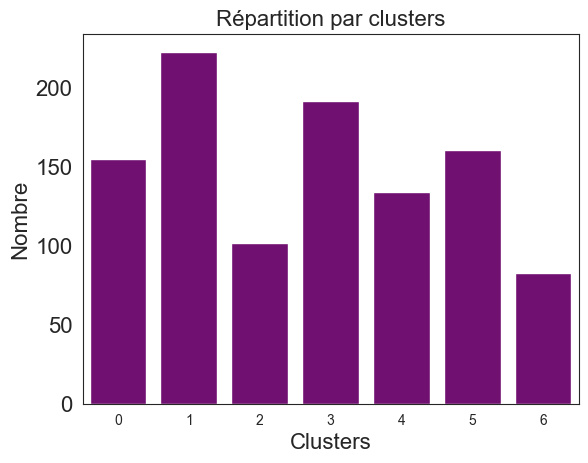

In [54]:
fonctions_data.affiche_repartition_par_clusters(labels)

Correspondance des clusters :  [6 4 5 3 1 2 0]


,precision,recall,f1-score,support
0,0.987952,0.546667,0.703863,150.000000
1,0.932836,0.833333,0.880282,150.000000
2,0.931677,1.000000,0.964630,150.000000
3,0.609375,0.780000,0.684211,150.000000
4,0.645740,0.960000,0.772118,150.000000
5,0.862745,0.586667,0.698413,150.000000
6,0.967742,1.000000,0.983607,150.000000
accuracy,0.815238,0.815238,0.815238,0.815238
macro avg,0.848295,0.815238,0.812446,1050.000000
weighted avg,0.848295,0.815238,0.812446,1050.000000


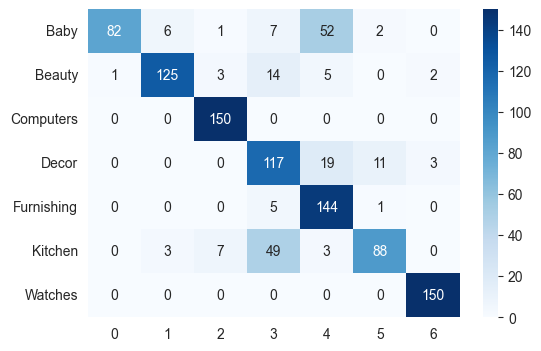

In [55]:
fonctions_data.conf_mat_metrics(df_comb_use_incep_tsne_km)

**Bilan**:

La classification automatique est bien possible à partir des données textes et des données images (avec les réseaux de neurones) avec des bons résultats de classification. La combinaison des deux approches texte et image a donné une meilleure performance sur l'ensemble des classes (matrice de confusion) avec **ARI = 65%**, un degré d'**homogénéité** de **73%**, et une **accuracy** de **81%**. L'utilisation d'une classification supervisée permettra d'obtenir encore une meilleure performance